## **Data Mining Project - Deliverable 1**

Student ID 1: 20250422

Student ID 2: 20250388

Student ID 3: 20250439

we can put this in here or in the end of the notebook

This project focus on an Exploratory Data Analysis, following the CRISP-DM Methodology

## Business Understanding

Goal: Segment customers of Amazing International Airlines Inc. to identify behaviorally and economically distinct groups.
Business questions:
 - Who are the high-value frequent travelers?
 - Which groups are at risk of churn?
 - How can we personalize marketing based on income, loyalty, or travel habits?

Success criteria:
 - Segments are interpretable (demographic, behavioral, value-based)
 - Each segment supports specific business actions (targeted offers, retention strategy)

For this we have two available datasets: 

- DM_AIAI_CustomerDB.csv : with information regarding the costumers on the loyalty program

- DM_AIAI_FlightsDB.csv : with information regarding the costumers' flying activity with AIAI Airlines

## Data Understanding

In [393]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import openpyxl
from dateutil.relativedelta import relativedelta
from math import ceil

In [ ]:
# Read the and import the files
customerDB = pd.read_csv('DM_AIAI_CustomerDB.csv')
flightsDB = pd.read_csv('DM_AIAI_FlightsDB.csv')

 **Metadata**

**CustomerDB:**
- **Loyalty# :** Unique customer identifier for loyalty program members;
- **First Name :** Customer's first name;
- **Last Name :** Customer's last name;
- **Customer Name :** Customer's full name (concatenated);
- **Country :** Customer's country of residence;
- **Province or State :** Customer's province or state;
- **City :** Customer's city of residence;
- **Latitude :** Geographic latitude coordinate of customer location;
- **Longitude :** Geographic longitude coordinate of customer location;
- **Postal code :** Customer's postal/ZIP code;
- **Gender :** Customer's gender;
- **Education :** Customer's highest education level (Bachelor, College, etc.);
- **Location Code :** Urban/Suburban/Rural classification of customer residence;
- **Income :** Customer's annual income;
- **Marital Status :** Customer's marital status (Married, Single, Divorced);
- **LoyaltyStatus :** Current tier status in loyalty program (Star > Nova > Aurora);
- **EnrollmentDateOpening :** Date when customer joined the loyalty program;
- **CancellationDate :** Date when customer left the program;
- **Customer Lifetime Value :** Total calculated monetary value of customer relationship;
- **EnrollmentType** : Method of joining loyalty program;

**FlightsDB:**
- **Loyalty# :** Unique customer identifier linking to CustomerDB;
- **Year :** Year of flight activity record;
- **Month :** Month of flight activity record (1-12);
- **YearMonthDate :** First day of the month for the activity period;
- **NumFlights :** Total number of flights taken by customer in the month;
- **NumFlightsWithCompanions :** Number of flights where customer traveled with companions;
- **DistanceKM :** Total distance traveled in kilometers for the month;
- **PointsAccumulated :** Loyalty points earned by customer during the month;
- **PointsRedeemed :** Loyalty points spent/redeemed by customer during the month;
- **DollarCostPointsRedeemed :** Dollar value of points redeemed during the month;

Loyalty is the costumer identifier so it should be the index for our datasets.

### **Analyzing CustomerDB**

In [396]:
customerDB.head()

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
0,0,480934,Cecilia,Householder,Cecilia Householder,Canada,Ontario,Toronto,43.653225,-79.383186,...,female,Bachelor,Urban,70146.0,Married,Star,2/15/2019,NaN,3839.14,Standard
1,1,549612,Dayle,Menez,Dayle Menez,Canada,Alberta,Edmonton,53.544388,-113.490930,...,male,College,Rural,0.0,Divorced,Star,3/9/2019,NaN,3839.61,Standard
2,2,429460,Necole,Hannon,Necole Hannon,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,male,College,Urban,0.0,Single,Star,7/14/2017,1/8/2021,3839.75,Standard
3,3,608370,Queen,Hagee,Queen Hagee,Canada,Ontario,Toronto,43.653225,-79.383186,...,male,College,Suburban,0.0,Single,Star,2/17/2016,NaN,3839.75,Standard
4,4,530508,Claire,Latting,Claire Latting,Canada,Quebec,Hull,45.428730,-75.713364,...,male,Bachelor,Suburban,97832.0,Married,Star,10/25/2017,NaN,3842.79,2021 Promotion


In [397]:
customerDB.columns

Index(['Unnamed: 0', 'Loyalty#', 'First Name', 'Last Name', 'Customer Name',
       'Country', 'Province or State', 'City', 'Latitude', 'Longitude',
       'Postal code', 'Gender', 'Education', 'Location Code', 'Income',
       'Marital Status', 'LoyaltyStatus', 'EnrollmentDateOpening',
       'CancellationDate', 'Customer Lifetime Value', 'EnrollmentType'],
      dtype='object')

In [398]:
customerDB.shape

(16921, 21)

In [399]:
customerDB.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,16921.0,8440.023639,4884.775439,0.000000,4210.000000,8440.000000,12670.000000,16900.000000
Loyalty#,16921.0,550197.393771,259251.503597,100011.000000,326823.000000,550896.000000,772438.000000,999999.000000
Latitude,16921.0,47.174500,3.307971,42.984924,44.231171,46.087818,49.282730,60.721188
Longitude,16921.0,-91.814768,22.242429,-135.056840,-120.237660,-79.383186,-74.596184,-52.712578
Income,16901.0,37758.038400,30368.992499,0.000000,0.000000,34161.000000,62396.000000,99981.000000
Customer Lifetime Value,16901.0,7990.460188,6863.173093,1898.010000,3979.720000,5780.180000,8945.690000,83325.380000


In 'Income' column we can see that at least 25% of customers in the Loyaty Program have Income equal to 0. We can analyze if they are either unemployed or students further on.

In [400]:
customerDB.describe(include=['object']).T

,count,unique,top,freq
First Name,16921,4941,Stacey,13
Last Name,16921,15404,Ypina,4
Customer Name,16921,16921,Emma Martin,1
Country,16921,1,Canada,16921
Province or State,16921,11,Ontario,5468
City,16921,29,Toronto,3390
Postal code,16921,75,V6E 3D9,917
Gender,16921,2,female,8497
Education,16921,5,Bachelor,10586
Location Code,16921,3,Suburban,5716


Observations:

- Female/Masculine customers are well distributed.

- A big percentage of customers have a Bachelor degree.

- More than half of the customers are married.

- Almost half of customers are in the LoyaltyStatus 'Star'. Are the remaining associated with very high income? can we create a group by this?

In [401]:
customerDB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16921 entries, 0 to 16920
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               16921 non-null  int64  
 1   Loyalty#                 16921 non-null  int64  
 2   First Name               16921 non-null  object 
 3   Last Name                16921 non-null  object 
 4   Customer Name            16921 non-null  object 
 5   Country                  16921 non-null  object 
 6   Province or State        16921 non-null  object 
 7   City                     16921 non-null  object 
 8   Latitude                 16921 non-null  float64
 9   Longitude                16921 non-null  float64
 10  Postal code              16921 non-null  object 
 11  Gender                   16921 non-null  object 
 12  Education                16921 non-null  object 
 13  Location Code            16921 non-null  object 
 14  Income                

The data types seem to be correct, let's examine the null values:

In [402]:
customerDB.isnull().sum()

Unnamed: 0                     0
Loyalty#                       0
First Name                     0
Last Name                      0
Customer Name                  0
Country                        0
Province or State              0
City                           0
Latitude                       0
Longitude                      0
Postal code                    0
Gender                         0
Education                      0
Location Code                  0
Income                        20
Marital Status                 0
LoyaltyStatus                  0
EnrollmentDateOpening          0
CancellationDate           14611
Customer Lifetime Value       20
EnrollmentType                 0
dtype: int64

**CancellationDate column:**

- Missingness: Not random

- Reason: Customer never cancelled : meaningful

- Treatment: No imputation needed


**Customer Lifetime Value column:**

- Missingness: Not random

- Reason: seems to be new customers with no history

- Treatment: Could impute with mean/median or predictive model or drop rows


**Income column:**

- Missingness: Random

- Reason: Customer did not provide or data not collected

- Treatment: Can impute with median or regression model or drop rows

In [403]:
income_null = customerDB[customerDB['Income'].isnull()]
income_null.head()

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
16901,0,999987,Layla,Murphy,Layla Murphy,Canada,New Brunswick,Fredericton,46.029263,-66.565150,...,female,Bachelor,Urban,NaN,Single,Star,3/7/2017,3/7/2017,NaN,Standard
16902,1,999988,Jana,Parker,Jana Parker,Canada,Quebec,Montreal,45.573672,-73.523012,...,male,College,Rural,NaN,Single,Star,8/22/2017,8/22/2017,NaN,Standard
16903,2,999989,Ethan,Parker,Ethan Parker,Canada,Ontario,Trenton,44.075379,-77.550375,...,male,College,Rural,NaN,Married,Star,9/12/2015,9/12/2015,NaN,Standard
16904,3,999990,Ryan,Anderson,Ryan Anderson,Canada,New Brunswick,Moncton,46.106617,-64.714267,...,female,College,Rural,NaN,Married,Star,6/10/2019,6/10/2019,NaN,Standard
16905,4,999991,Olivia,Cote,Olivia Cote,Canada,New Brunswick,Fredericton,45.950000,-66.652437,...,female,College,Suburban,NaN,Married,Star,7/20/2019,7/20/2019,NaN,Standard


In [404]:
lifetime_value_null = customerDB[customerDB['Customer Lifetime Value'].isnull()]
lifetime_value_null.head()

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
16901,0,999987,Layla,Murphy,Layla Murphy,Canada,New Brunswick,Fredericton,46.029263,-66.565150,...,female,Bachelor,Urban,NaN,Single,Star,3/7/2017,3/7/2017,NaN,Standard
16902,1,999988,Jana,Parker,Jana Parker,Canada,Quebec,Montreal,45.573672,-73.523012,...,male,College,Rural,NaN,Single,Star,8/22/2017,8/22/2017,NaN,Standard
16903,2,999989,Ethan,Parker,Ethan Parker,Canada,Ontario,Trenton,44.075379,-77.550375,...,male,College,Rural,NaN,Married,Star,9/12/2015,9/12/2015,NaN,Standard
16904,3,999990,Ryan,Anderson,Ryan Anderson,Canada,New Brunswick,Moncton,46.106617,-64.714267,...,female,College,Rural,NaN,Married,Star,6/10/2019,6/10/2019,NaN,Standard
16905,4,999991,Olivia,Cote,Olivia Cote,Canada,New Brunswick,Fredericton,45.950000,-66.652437,...,female,College,Suburban,NaN,Married,Star,7/20/2019,7/20/2019,NaN,Standard


In [405]:
#confirm that the rows with null-values for this columns are the same ones
# df1.equals(df2) returns True if the Data Frames have the same indexes, columns and values
income_null.equals(lifetime_value_null)

True

We noticed that, the missing values from 'Income' and 'Customer Lifetime Value' are the same. By analyzing the rest of the data, we can see that the 'EnrollmentDateOpening' and 'CancellationDate' are the same which means that this 20 customers have gotten into the program on the same day they cancelled the program and also entered by the Standard mode.

For a double-check before deciding to drop the rows, we will check if these Loyaty#'s have any activity in the FlightsDB.

If they do not have any information in FlightsDB, since they didn't spend even a day in the program and have restricted information, we are are going to drop these rows in Data Preparation.

**Check for duplicates**

In [406]:
# Check for total duplicated rows
customerDB.duplicated().sum()

np.int64(0)

There are no total duplicates

In [407]:
# Check for duplicates in 'Unnamed: 0'
customerDB.duplicated(subset='Unnamed: 0').sum()

np.int64(20)

In [408]:
unnamed_duplicates = customerDB[customerDB.duplicated(subset='Unnamed: 0')]
unnamed_duplicates

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
16901,0,999987,Layla,Murphy,Layla Murphy,Canada,New Brunswick,Fredericton,46.029263,-66.565150,...,female,Bachelor,Urban,NaN,Single,Star,3/7/2017,3/7/2017,NaN,Standard
16902,1,999988,Jana,Parker,Jana Parker,Canada,Quebec,Montreal,45.573672,-73.523012,...,male,College,Rural,NaN,Single,Star,8/22/2017,8/22/2017,NaN,Standard
16903,2,999989,Ethan,Parker,Ethan Parker,Canada,Ontario,Trenton,44.075379,-77.550375,...,male,College,Rural,NaN,Married,Star,9/12/2015,9/12/2015,NaN,Standard
16904,3,999990,Ryan,Anderson,Ryan Anderson,Canada,New Brunswick,Moncton,46.106617,-64.714267,...,female,College,Rural,NaN,Married,Star,6/10/2019,6/10/2019,NaN,Standard
16905,4,999991,Olivia,Cote,Olivia Cote,Canada,New Brunswick,Fredericton,45.950000,-66.652437,...,female,College,Suburban,NaN,Married,Star,7/20/2019,7/20/2019,NaN,Standard
16906,5,999992,Ella,Roy,Ella Roy,Canada,Ontario,Toronto,43.706878,-79.437412,...,male,College,Suburban,NaN,Single,Star,3/27/2021,3/27/2021,NaN,Standard
16907,6,999993,Elijah,Cook,Elijah Cook,Canada,British Columbia,Dawson Creek,55.701475,-120.181716,...,female,College,Suburban,NaN,Married,Star,1/27/2015,1/27/2015,NaN,Standard
16908,7,999994,Ethan,Chan,Ethan Chan,Canada,Ontario,Ottawa,45.365906,-75.723181,...,female,College,Rural,NaN,Married,Star,5/5/2016,5/5/2016,NaN,Standard
16909,8,999995,Liam,Wong,Liam Wong,Canada,Ontario,Ottawa,45.471557,-75.704868,...,female,College,Suburban,NaN,Married,Star,3/2/2020,3/2/2020,NaN,Standard
16910,9,999996,Isabella,Ross,Isabella Ross,Canada,Ontario,Toronto,43.690489,-79.436758,...,female,Bachelor,Suburban,NaN,Single,Star,9/14/2018,9/14/2018,NaN,Standard


We have 16921 observations in the costumers data set. It seems that after row 16900, the index/'Unnamed: 0' started again at 0. There are duplicates but if we look closer, they are the same exact rows as the ones with the null-values in 'Income' and 'Customer Lifetime Value':

In [409]:
#confirm that the duplicated rows for 'Unnamed: 0' are the same ones as for 'Customer Lifetime Value',
#and also for 'Income' since they are the same as checked before
unnamed_duplicates.equals(lifetime_value_null)

True

Check if these Loyaty#'s have activity in the FlightsDB:

In [410]:
customers_incorrect_index = unnamed_duplicates.index
customers_incorrect_loyalty = unnamed_duplicates['Loyalty#']
customers_incorrect_loyalty

16901    999987
16902    999988
16903    999989
16904    999990
16905    999991
16906    999992
16907    999993
16908    999994
16909    999995
16910    999996
16911    999997
16912    999998
16913    999999
16914    100017
16915    100011
16916    100012
16917    100013
16918    100014
16919    100015
16920    100016
Name: Loyalty#, dtype: int64

In [411]:
flightsDB[flightsDB['Loyalty#'].isin(customers_incorrect_loyalty)]

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed


Since there are no rows, these customers have no activity with this company. With all this analysis we decided to drop the these rows because they don't give us any relevant information for clustering.

In [412]:
customerDB.drop(customers_incorrect_index, inplace=True)
customerDB.tail()

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
16896,16896,823768,Mandy,Sammarco,Mandy Sammarco,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,female,College,Rural,0.0,Married,Star,12/22/2015,NaN,61850.19,Standard
16897,16897,680886,Jamee,Ahlm,Jamee Ahlm,Canada,Saskatchewan,Regina,50.445210,-104.618900,...,female,Bachelor,Rural,78310.0,Married,Star,9/6/2017,NaN,67907.27,Standard
16898,16898,776187,Janina,Lumb,Janina Lumb,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,male,College,Urban,0.0,Single,Star,3/24/2017,NaN,74228.52,Standard
16899,16899,615459,Dannie,Paplow,Dannie Paplow,Canada,Quebec,Montreal,45.501690,-73.567253,...,male,Bachelor,Urban,58958.0,Married,Star,4/22/2021,12/22/2021,83325.38,2021 Promotion
16900,16900,652627,Ariane,Peyton,Ariane Peyton,Canada,Manitoba,Winnipeg,49.895138,-97.138374,...,female,Bachelor,Suburban,58958.0,Married,Star,12/3/2018,8/3/2019,83325.38,Standard


In [413]:
customerDB.duplicated(subset='Loyalty#').sum()

np.int64(164)

In [414]:
duplicated_customers = customerDB[customerDB.duplicated(subset='Loyalty#', keep = False)]
duplicated_customers

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
5,5,193662,Leatrice,Hanlin,Leatrice Hanlin,Canada,Yukon,Whitehorse,60.721188,-135.056840,...,male,Bachelor,Rural,26262.0,Married,Star,5/7/2015,NaN,3844.57,Standard
123,123,746226,Theodora,Sampieri,Theodora Sampieri,Canada,British Columbia,Whistler,50.116322,-122.957360,...,female,Bachelor,Urban,43177.0,Married,Star,1/17/2021,NaN,4089.04,Standard
141,141,279419,Reyes,Sobczak,Reyes Sobczak,Canada,British Columbia,West Vancouver,49.328625,-123.160190,...,female,College,Urban,0.0,Single,Star,7/3/2016,NaN,4117.37,Standard
161,161,354438,Maricela,Veals,Maricela Veals,Canada,Quebec,Montreal,45.501690,-73.567253,...,male,College,Rural,0.0,Married,Star,9/1/2021,NaN,4167.09,Standard
204,204,719633,Elnora,Holzmiller,Elnora Holzmiller,Canada,British Columbia,Victoria,48.428421,-123.365650,...,male,Bachelor,Suburban,27608.0,Divorced,Star,12/3/2019,NaN,4250.78,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16488,16488,373638,Sherryl,Vanduyn,Sherryl Vanduyn,Canada,Quebec,Tremblant,46.118462,-74.596184,...,female,College,Rural,0.0,Single,Star,7/30/2021,NaN,18898.33,Standard
16625,16625,727507,Marnie,Kisner,Marnie Kisner,Canada,Alberta,Banff,51.178398,-115.570800,...,male,Bachelor,Suburban,93011.0,Divorced,Star,12/26/2020,NaN,22643.83,Standard
16766,16766,278854,Marylee,Villicana,Marylee Villicana,Canada,Quebec,Tremblant,46.118462,-74.596184,...,female,High School or Below,Urban,20799.0,Single,Star,8/16/2017,NaN,28328.47,Standard
16775,16775,434807,Cira,Nalley,Cira Nalley,Canada,Alberta,Edmonton,53.544388,-113.490930,...,male,Bachelor,Rural,35296.0,Single,Star,8/27/2015,NaN,29194.37,Standard


In [415]:
customerDB[customerDB['Loyalty#'] == 368073]

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
5003,5003,368073,Rufus,Dannenberg,Rufus Dannenberg,Canada,Quebec,Montreal,45.501690,-73.567253,...,female,Doctor,Suburban,19447.0,Married,Nova,3/27/2020,NaN,3336.22,Standard
16881,16881,368073,Enedina,Dickason,Enedina Dickason,Canada,Quebec,Quebec City,46.813877,-71.207977,...,male,Bachelor,Urban,66661.0,Single,Star,3/20/2018,NaN,42561.63,Standard


With this information we can see that, there are 164 duplicates and they don't belong neither to the same customer neither do they belong to related people (different Last Names and different cities).


In [416]:
len(duplicated_customers) / len(customerDB) * 100

1.9347967575883085

The number of duplicates in the customer Loyalty number is only 1.9 %. After analysing the flights data set we will decide if we can identidy and separate the costumers or if we should drop them.

### **Analyzing FlightsDB**

In [417]:
flightsDB.head()

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed
0,413052,2021,12,12/1/2021,2.0,2.0,9384.0,938.0,0.0,0.0
1,464105,2021,12,12/1/2021,0.0,0.0,0.0,0.0,0.0,0.0
2,681785,2021,12,12/1/2021,10.0,3.0,14745.0,1474.0,0.0,0.0
3,185013,2021,12,12/1/2021,16.0,4.0,26311.0,2631.0,3213.0,32.0
4,216596,2021,12,12/1/2021,9.0,0.0,19275.0,1927.0,0.0,0.0


In [418]:
flightsDB.columns

Index(['Loyalty#', 'Year', 'Month', 'YearMonthDate', 'NumFlights',
       'NumFlightsWithCompanions', 'DistanceKM', 'PointsAccumulated',
       'PointsRedeemed', 'DollarCostPointsRedeemed'],
      dtype='object')

In [419]:
flightsDB.shape

(608436, 10)

**Duplicated Loyalty# Solution**

In [420]:
flightsDB[flightsDB['Loyalty#'].isin(duplicated_customers['Loyalty#'])]

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed
27,279419,2021,12,12/1/2021,12.0,0.0,11849.0,1184.00,0.0,0.0
171,990512,2021,12,12/1/2021,5.0,2.0,31991.0,3199.00,0.0,0.0
248,322169,2021,12,12/1/2021,2.0,0.0,17125.0,1712.00,0.0,0.0
297,106001,2021,12,12/1/2021,7.0,0.0,26469.0,2646.00,0.0,0.0
450,727091,2021,12,12/1/2021,0.0,0.0,0.0,0.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
608249,989528,2019,12,12/1/2019,0.0,0.0,0.0,0.00,0.0,0.0
608263,990512,2019,12,12/1/2019,0.0,0.0,0.0,0.00,0.0,0.0
608264,990512,2019,12,12/1/2019,0.0,0.0,0.0,0.00,0.0,0.0
608298,992168,2019,12,12/1/2019,11.7,4.5,2987.1,298.71,0.0,0.0


In [421]:
flightsDB[flightsDB['Loyalty#'] == 279419] # the loyalty number of the first row of the above output

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed
27,279419,2021,12,12/1/2021,12.0,0.0,11849.0,1184.00,0.0,0.0
6655,279419,2020,6,6/1/2020,0.0,0.0,0.0,0.00,0.0,0.0
16082,279419,2020,5,5/1/2020,3.0,3.0,12848.0,1284.00,0.0,0.0
29682,279419,2020,5,5/1/2020,0.0,0.0,0.0,0.00,0.0,0.0
30324,279419,2020,4,4/1/2020,0.0,0.0,0.0,0.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
561096,279419,2019,10,10/1/2019,5.4,5.4,15857.1,1585.71,3365.1,33.3
577996,279419,2019,11,11/1/2019,2.7,0.0,15080.4,1508.04,0.0,0.0
577997,279419,2019,11,11/1/2019,9.9,0.0,23248.8,2324.88,0.0,0.0
594897,279419,2019,12,12/1/2019,0.9,0.0,7848.0,784.80,0.0,0.0


In the last 2 rows we have information about the same date so we can see that the loyalties are still repeated in this data set. We could probably associate the total points accumulated by costumer with the Customer Lifetime Value in the costumers data set, however, we can not differenciate the the duplicates in the flights data set so we dont know how to calculate the total of the Points Accumulated for the duplicates. For this reason, and because they represent a small percentage of the customers, we will drop the correspoding loyalty numbers 

In [422]:
customerDB.drop(duplicated_customers.index, inplace=True)
customerDB

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,Gender,Education,Location Code,Income,Marital Status,LoyaltyStatus,EnrollmentDateOpening,CancellationDate,Customer Lifetime Value,EnrollmentType
0,0,480934,Cecilia,Householder,Cecilia Householder,Canada,Ontario,Toronto,43.653225,-79.383186,...,female,Bachelor,Urban,70146.0,Married,Star,2/15/2019,NaN,3839.14,Standard
1,1,549612,Dayle,Menez,Dayle Menez,Canada,Alberta,Edmonton,53.544388,-113.490930,...,male,College,Rural,0.0,Divorced,Star,3/9/2019,NaN,3839.61,Standard
2,2,429460,Necole,Hannon,Necole Hannon,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,male,College,Urban,0.0,Single,Star,7/14/2017,1/8/2021,3839.75,Standard
3,3,608370,Queen,Hagee,Queen Hagee,Canada,Ontario,Toronto,43.653225,-79.383186,...,male,College,Suburban,0.0,Single,Star,2/17/2016,NaN,3839.75,Standard
4,4,530508,Claire,Latting,Claire Latting,Canada,Quebec,Hull,45.428730,-75.713364,...,male,Bachelor,Suburban,97832.0,Married,Star,10/25/2017,NaN,3842.79,2021 Promotion
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16896,16896,823768,Mandy,Sammarco,Mandy Sammarco,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,female,College,Rural,0.0,Married,Star,12/22/2015,NaN,61850.19,Standard
16897,16897,680886,Jamee,Ahlm,Jamee Ahlm,Canada,Saskatchewan,Regina,50.445210,-104.618900,...,female,Bachelor,Rural,78310.0,Married,Star,9/6/2017,NaN,67907.27,Standard
16898,16898,776187,Janina,Lumb,Janina Lumb,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,male,College,Urban,0.0,Single,Star,3/24/2017,NaN,74228.52,Standard
16899,16899,615459,Dannie,Paplow,Dannie Paplow,Canada,Quebec,Montreal,45.501690,-73.567253,...,male,Bachelor,Urban,58958.0,Married,Star,4/22/2021,12/22/2021,83325.38,2021 Promotion


In [423]:
customerDB.duplicated().sum()
# check if the duplicates were removed correctly

np.int64(0)

In [424]:
# remove the customers duplicates in the flights data set
flightsDB.drop(flightsDB[flightsDB['Loyalty#'].isin(duplicated_customers['Loyalty#'])].index, inplace = True)
flightsDB


,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed
0,413052,2021,12,12/1/2021,2.0,2.0,9384.0,938.00,0.0,0.0
1,464105,2021,12,12/1/2021,0.0,0.0,0.0,0.00,0.0,0.0
2,681785,2021,12,12/1/2021,10.0,3.0,14745.0,1474.00,0.0,0.0
3,185013,2021,12,12/1/2021,16.0,4.0,26311.0,2631.00,3213.0,32.0
4,216596,2021,12,12/1/2021,9.0,0.0,19275.0,1927.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
608431,999902,2019,12,12/1/2019,7.2,0.0,30766.5,3076.65,0.0,0.0
608432,999911,2019,12,12/1/2019,0.0,0.0,0.0,0.00,0.0,0.0
608433,999940,2019,12,12/1/2019,14.4,0.9,18261.0,1826.10,0.0,0.0
608434,999982,2019,12,12/1/2019,0.0,0.0,0.0,0.00,0.0,0.0


In [425]:
flightsDB.info()

<class 'pandas.core.frame.DataFrame'>
Index: 596664 entries, 0 to 608435
Data columns (total 10 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Loyalty#                  596664 non-null  int64  
 1   Year                      596664 non-null  int64  
 2   Month                     596664 non-null  int64  
 3   YearMonthDate             596664 non-null  object 
 4   NumFlights                596664 non-null  float64
 5   NumFlightsWithCompanions  596664 non-null  float64
 6   DistanceKM                596664 non-null  float64
 7   PointsAccumulated         596664 non-null  float64
 8   PointsRedeemed            596664 non-null  float64
 9   DollarCostPointsRedeemed  596664 non-null  float64
dtypes: float64(6), int64(3), object(1)
memory usage: 50.1+ MB


We have 3 variables dedicated to the time, this is tripling its significance, we will probably just use the 'YearMonthDate' but we have to change it to datetim type. Check if there is a relationship between the Distance and the Points acummulated, or the number of flights. The points redeemed and the Cost of the points redeemed is probably redundant. 'PointsAccumulated', 'PointsRedeemed', 'DollarCostPointsRedeemed', 'DistanceKM', 'NumFlights' and 'NumFlightsWithCompanions' are floats. Lets see if they are correct.

In [426]:
# if the features related to points or distance have more than 2 decimals, then it would be odd
points_related_features = ['PointsAccumulated', 'PointsRedeemed', 'DollarCostPointsRedeemed', 'DistanceKM']
for feat in points_related_features:
     odd_values = flightsDB[feat].apply(lambda x: len(str(x).split('.')[1]) > 2).sum()
     print(f'{feat} odd values : {odd_values}')

PointsAccumulated odd values : 0
PointsRedeemed odd values : 0
DollarCostPointsRedeemed odd values : 0
DistanceKM odd values : 0


The floats in these columns only have 2 decimals, which is normal. However 'NumFlights' and 'NumFlightsWithCompanions' are also floats when they should be integers.

**Analyze the problem with NumFlights as floats:**

In [427]:
flightsDB['NumFlights'].value_counts()

NumFlights
0.0     297319
9.0      20045
3.0      17914
11.0     15452
5.0      14834
7.0      14352
8.0      14134
6.0      13646
2.0      13418
10.0     13162
4.0      12616
1.0      12476
13.0     10638
12.0     10233
9.9       7428
14.0      6954
2.7       6809
6.3       6683
7.2       6638
5.4       6584
15.0      6499
8.1       6427
3.6       6414
4.5       6266
1.8       6220
0.9       5752
10.8      5327
11.7      5097
16.0      4294
17.0      3834
18.0      3454
13.5      3235
12.6      3198
14.4      2140
15.3      1781
19.0      1473
16.2      1343
20.0      1140
17.1       688
21.0       519
18.9       228
Name: count, dtype: int64

In [428]:
flightsDB['NumFlights'].nunique()

41

In [429]:
flights_related_features = ['NumFlights', 'NumFlightsWithCompanions']
for feat in flights_related_features:
     not_int = flightsDB[feat].apply(lambda x: x % 1 != 0).sum()
     print(f'{feat} nr of floats : {not_int}')

NumFlights nr of floats : 88258
NumFlightsWithCompanions nr of floats : 50090


The number of floats in these features is very high, lets check the percentage

In [430]:
len( flightsDB[ (flightsDB['NumFlights'] % 1 != 0) | (flightsDB['NumFlightsWithCompanions'] % 1 != 0)]) / len(flightsDB) * 100

15.371800544359976

15 % of the data in flightsDB has floats either in 'NumFlights' or 'NumFlightsWithCompanions'. This value is ver large so we can not remove these observations since we would be losing too much information. The best aproach to this would be to round all of them down. Being a float should not affect the visualizations so we will only do this step in Data Preparation.

In [431]:
flightsDB.describe().T

,count,mean,std,min,25%,50%,75%,max
Loyalty#,596664.0,549435.680825,258867.195581,100018.0,326234.00,550020.0,771901.00,999986.0
Year,596664.0,2020.000000,0.816497,2019.0,2019.00,2020.0,2021.00,2021.0
Month,596664.0,6.500000,3.452055,1.0,3.75,6.5,9.25,12.0
NumFlights,596664.0,3.926646,5.063236,0.0,0.00,0.9,7.20,21.0
NumFlightsWithCompanions,596664.0,0.988214,2.006975,0.0,0.00,0.0,1.00,11.0
DistanceKM,596664.0,7973.603444,10269.174348,0.0,0.00,984.5,15400.00,42040.0
PointsAccumulated,596664.0,797.203290,1026.793920,0.0,0.00,98.0,1540.00,4204.0
PointsRedeemed,596664.0,236.469767,985.680370,0.0,0.00,0.0,0.00,7496.0
DollarCostPointsRedeemed,596664.0,2.336869,9.749377,0.0,0.00,0.0,0.00,74.0


21 flights in a single month seems almost impossible. Could it be an error? There is a huge difference between the 75% percentile and the maximum value in NumFlightsWithCompanions, could this be a niche group in the data set that travels a lot with companions and could have similar characterists in the costumers data set.

In [432]:
flightsDB[flightsDB['NumFlights'] > 20]

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed
199208,278815,2021,7,7/1/2021,21.0,0.0,34356.0,3435.0,0.0,0.0
199233,677527,2021,7,7/1/2021,21.0,11.0,4987.0,498.0,0.0,0.0
199256,375265,2021,7,7/1/2021,21.0,4.0,18624.0,1862.0,0.0,0.0
199392,923959,2021,7,7/1/2021,21.0,9.0,31183.0,3118.0,6066.0,60.0
199490,966391,2021,7,7/1/2021,21.0,9.0,37452.0,3745.0,5728.0,57.0
...,...,...,...,...,...,...,...,...,...,...
394134,488853,2020,7,7/1/2020,21.0,0.0,35631.0,3563.0,0.0,0.0
394196,113877,2020,7,7/1/2020,21.0,7.0,32961.0,3296.0,0.0,0.0
394269,155964,2020,7,7/1/2020,21.0,0.0,22935.0,2293.0,0.0,0.0
394323,675516,2020,7,7/1/2020,21.0,5.0,31675.0,3167.0,7045.0,70.0


A lot of costumers have a very high number of flights per month. These people could have similar characteristics so it should be interesting to analyse the relationship between this variable and the ones in the costumers data set

In [433]:
flightsDB.describe(include='object').T

,count,unique,top,freq
YearMonthDate,596664,36,12/1/2021,16574


In [434]:
((flightsDB['YearMonthDate'].value_counts()) != 16901).sum()

np.int64(36)

All the costumers have 36 rows in the flights data set, one for each month of the period 2019-2021. So each date appears 16901 times

In [435]:
flightsDB['YearMonthDate'].unique()

array(['12/1/2021', '6/1/2020', '5/1/2020', '4/1/2020', '3/1/2020',
       '2/1/2020', '1/1/2020', '11/1/2021', '10/1/2021', '6/1/2021',
       '9/1/2021', '5/1/2021', '4/1/2021', '8/1/2021', '7/1/2021',
       '3/1/2021', '2/1/2021', '1/1/2021', '12/1/2020', '11/1/2020',
       '10/1/2020', '9/1/2020', '8/1/2020', '7/1/2020', '1/1/2019',
       '2/1/2019', '3/1/2019', '4/1/2019', '5/1/2019', '6/1/2019',
       '7/1/2019', '8/1/2019', '9/1/2019', '10/1/2019', '11/1/2019',
       '12/1/2019'], dtype=object)

All the values in this column refer to the first day of the month so the values could be switched in order to refer only the month and year. We will transform this column in a datetime column so we can plot information throughout time and only keep the month and year since the day is always the first of the month.

In [436]:
flightsDB['YearMonthDate'] = pd.to_datetime(flightsDB['YearMonthDate'])
flightsDB['YearMonthDate'].dtype

dtype('<M8[ns]')

In [437]:
flightsDB['YearMonth'] = flightsDB['YearMonthDate'].dt.strftime('%Y-%m')
flightsDB

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed,YearMonth
0,413052,2021,12,2021-12-01,2.0,2.0,9384.0,938.00,0.0,0.0,2021-12
1,464105,2021,12,2021-12-01,0.0,0.0,0.0,0.00,0.0,0.0,2021-12
2,681785,2021,12,2021-12-01,10.0,3.0,14745.0,1474.00,0.0,0.0,2021-12
3,185013,2021,12,2021-12-01,16.0,4.0,26311.0,2631.00,3213.0,32.0,2021-12
4,216596,2021,12,2021-12-01,9.0,0.0,19275.0,1927.00,0.0,0.0,2021-12
...,...,...,...,...,...,...,...,...,...,...,...
608431,999902,2019,12,2019-12-01,7.2,0.0,30766.5,3076.65,0.0,0.0,2019-12
608432,999911,2019,12,2019-12-01,0.0,0.0,0.0,0.00,0.0,0.0,2019-12
608433,999940,2019,12,2019-12-01,14.4,0.9,18261.0,1826.10,0.0,0.0,2019-12
608434,999982,2019,12,2019-12-01,0.0,0.0,0.0,0.00,0.0,0.0,2019-12


**Duplicated values:**

In [438]:
flightsDB.duplicated().sum()

np.int64(0)

No duplicates

**Missing Values**

In [439]:
flightsDB.isnull().sum()

Loyalty#                    0
Year                        0
Month                       0
YearMonthDate               0
NumFlights                  0
NumFlightsWithCompanions    0
DistanceKM                  0
PointsAccumulated           0
PointsRedeemed              0
DollarCostPointsRedeemed    0
YearMonth                   0
dtype: int64

No missing values

**Inconsistencies:**

While analyzing both the dataset in the code and on Excel, we found out some inconsistencies:

In [440]:
#check if all the flights with companions had the correct information on number of flights
(flightsDB['NumFlights'] < flightsDB['NumFlightsWithCompanions']).sum()


np.int64(0)

The number of flights is always larger than the number of flights with companions, so there isnt a problem here

In [441]:
has_distancekm = flightsDB[flightsDB['DistanceKM'] != 0] #filter by rows with values different than 0 in Distances

In [442]:
detected_errors_distance = has_distancekm[has_distancekm['NumFlights'] == 0] #filter by rows with number of flights equal to 0
detected_errors_distance

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed,YearMonth
19,261109,2021,12,2021-12-01,0.0,0.0,13736.0,1373.00,0.0,0.0,2021-12
93,817609,2021,12,2021-12-01,0.0,0.0,23775.0,2377.00,0.0,0.0,2021-12
96,192600,2021,12,2021-12-01,0.0,0.0,5119.0,511.00,0.0,0.0,2021-12
116,883242,2021,12,2021-12-01,0.0,0.0,20681.0,2068.00,0.0,0.0,2021-12
154,493800,2021,12,2021-12-01,0.0,0.0,17502.0,1750.00,0.0,0.0,2021-12
...,...,...,...,...,...,...,...,...,...,...,...
607387,944702,2019,12,2019-12-01,0.0,0.0,29223.0,2922.30,0.0,0.0,2019-12
607549,952629,2019,12,2019-12-01,0.0,0.0,27342.9,2734.29,0.0,0.0,2019-12
607594,954973,2019,12,2019-12-01,0.0,0.0,6436.8,643.68,0.0,0.0,2019-12
607744,962989,2019,12,2019-12-01,0.0,0.0,15922.8,1592.28,0.0,0.0,2019-12


We have observations with 0 flights in the month but with distance different from 0, that doesnt make any sense

In [443]:
len(detected_errors_distance)/len(flightsDB['DistanceKM'])

0.009759261493906117

**Relationship between 'DistanceKM' and 'PointsAccumulated'**

In [444]:
has_distancekm[has_distancekm['PointsAccumulated'] == 0]

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed,YearMonth


In [445]:
percentage_KM_Points = has_distancekm['DistanceKM']/has_distancekm['PointsAccumulated']
round(percentage_KM_Points).value_counts()

10.0    305168
Name: count, dtype: int64

All rows with Distance in KM have Points Accumulated. With this, we understand that the Points Accumulated are calculated based on the Distance. Specifically, the Accumulated Points are 10% of the Distance in KM. These are redundant.

### **Visualizations**

##### **Customers**

In [446]:
sns.set_theme(
    style="whitegrid",
    rc={
        "axes.facecolor": "white",
        "figure.facecolor": "white",
        "grid.color": "white",
        "axes.edgecolor": "black",
        "axes.labelcolor": "black",
        "xtick.color": "black",
        "ytick.color": "black"
    }
)

In [447]:
customers_numerical = ['Income','Customer Lifetime Value']

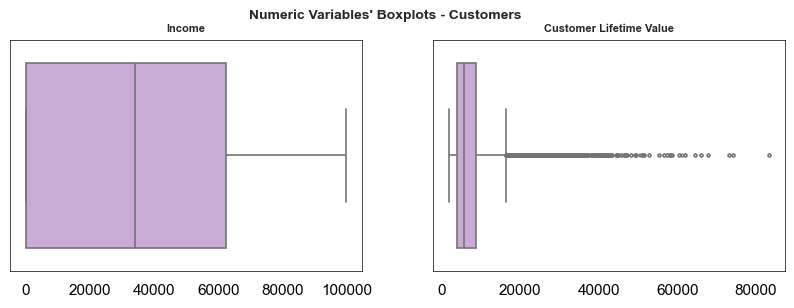

In [448]:


# We will put all the numeric variables' histograms in one figure
# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(1, 2, figsize = (10, 3))

for ax, feat in zip(axes.flatten(), customers_numerical):
    sns.boxplot(x=customerDB[feat], ax=ax, color='#CDA4DE', fliersize=2, linewidth=1.2)
    ax.set_title(feat, fontsize=8, fontweight='bold')
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Thickness of the border
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

# Add a centered title to the figure:
plt.suptitle("Numeric Variables' Boxplots - Customers", fontsize=10, fontweight='bold')

plt.show()

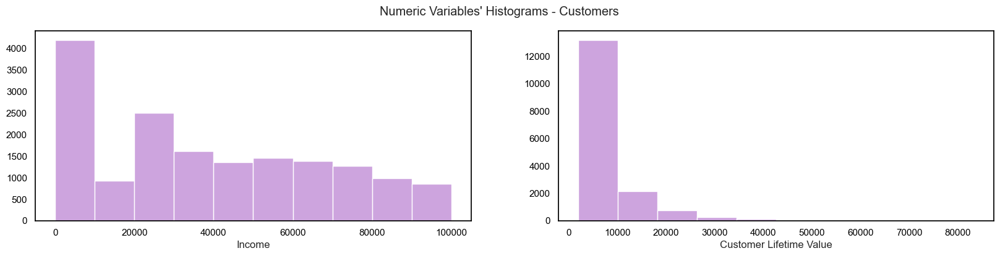

In [449]:
fig, axes = plt.subplots(1, 2, figsize=(20, 4))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), customers_numerical): # Notice the zip() function and flatten() method
    ax.hist(customerDB[feat], color = '#CDA4DE')
    ax.set_title(feat, y=-0.17)
    


plt.suptitle("Numeric Variables' Histograms - Customers")

plt.show()

We can see that a huge amount of customers doesnt have income, they are probably students. For the Customer Lifetime Value, the plot is very compressed which indicates that we have a lot of very high, extreme values, those are also shown as outliers in the corresponding boxplot

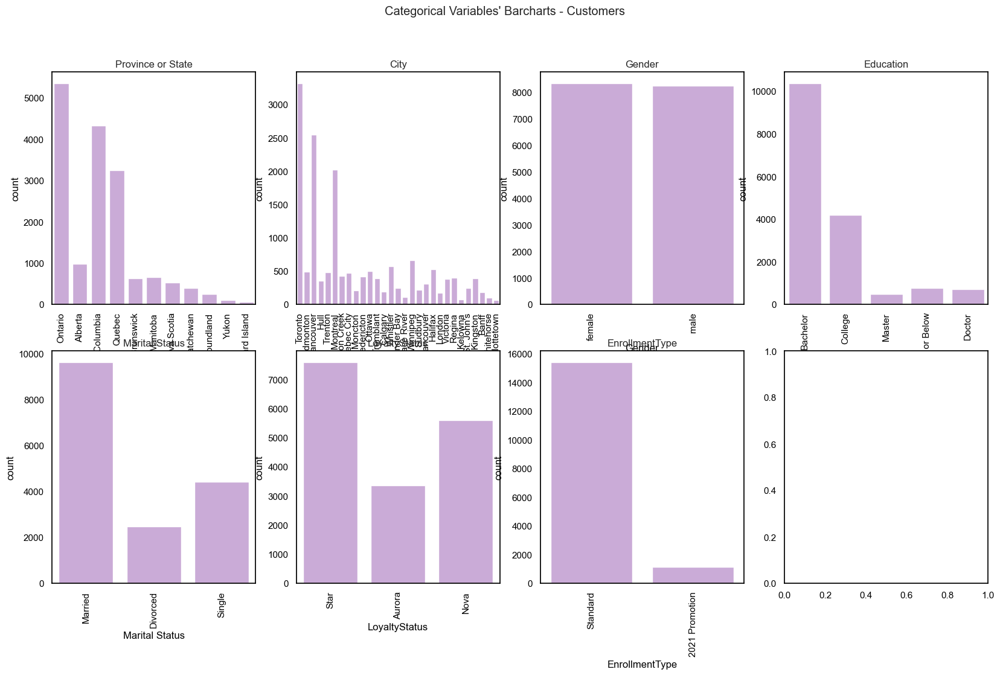

In [450]:
customers_categorical = ['Province or State', 'City', 'Gender', 'Education', 'Marital Status', 'LoyaltyStatus', 'EnrollmentType']

fig, axes = plt.subplots(2, ceil(len(customers_categorical) / 2 ), figsize = (20,11))



for ax, feat in zip(axes.flatten(), customers_categorical):
    sns.countplot(x=customerDB[feat], ax=ax, color='#CDA4DE')
    ax.set_title(feat)
    ax.tick_params(axis='x', rotation=90)

for ax in axes[len(customers_categorical):]:
    ax.set_visible(False)



# Add a centered title to the figure:
plt.suptitle("Categorical Variables' Barcharts - Customers")
plt.show()

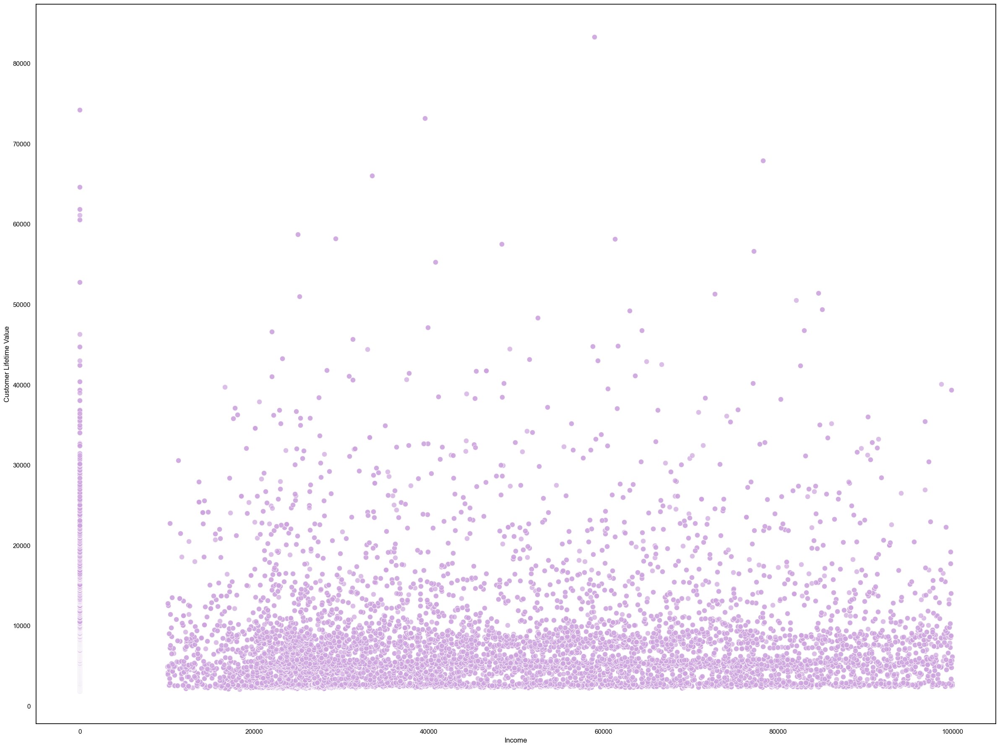

In [451]:
sns.scatterplot(
    data=customerDB,
    x="Income",
    y="Customer Lifetime Value",
    #"="gastos_mensais", # tamanho do ponto
    alpha=0.7,           # transparência para reduzir sobreposição
    color = "#CDA4DE" ,
    s = 80)

plt.tight_layout()
plt.show()

##### **Flights**

In [452]:
flights_numerical = flightsDB.columns.drop(['YearMonthDate', 'YearMonth', 'Month', 'Year', 'Loyalty#'])

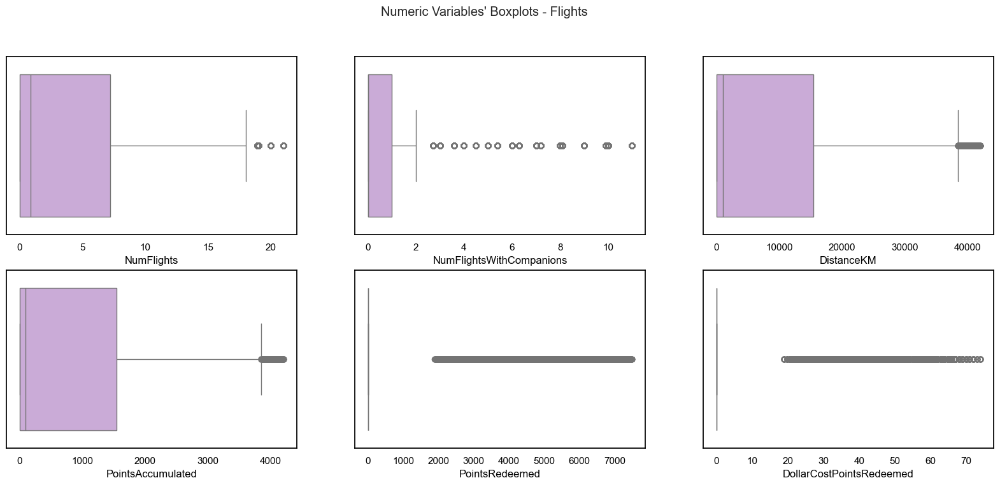

In [453]:



# We will put all the numeric variables' histograms in one figure
# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(flights_numerical) / 2 ), figsize = (20, 8))

for ax, feat in zip(axes.flatten(), flights_numerical):
    sns.boxplot(x=flightsDB[feat], ax=ax, color='#CDA4DE')

# Add a centered title to the figure:
plt.suptitle("Numeric Variables' Boxplots - Flights")

plt.show()

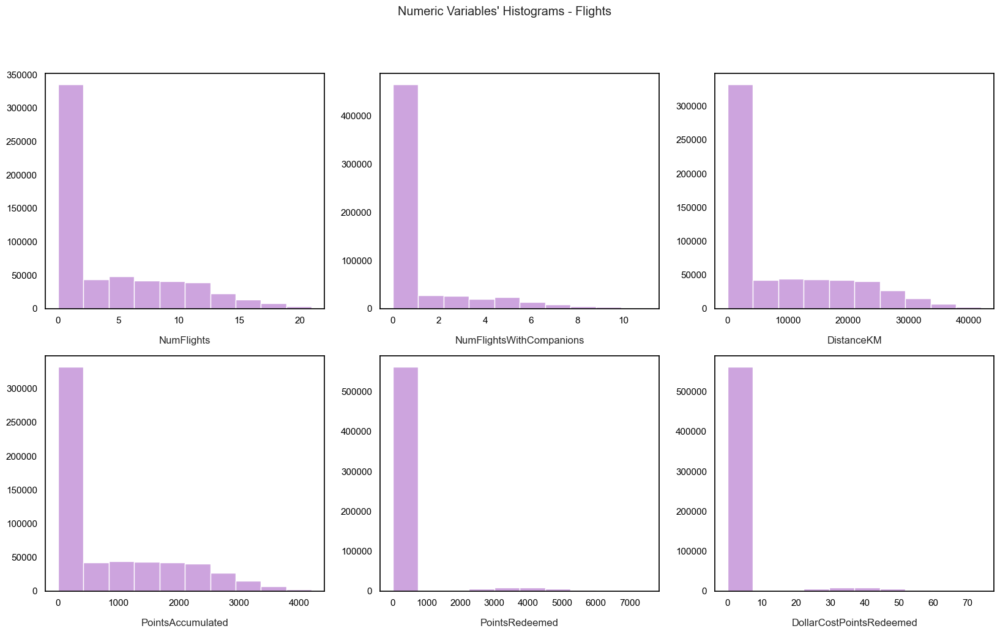

In [454]:
fig, axes = plt.subplots(2, ceil(len(flights_numerical) / 2 ), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), flights_numerical): # Notice the zip() function and flatten() method
    ax.hist(flightsDB[feat], color = "#CDA4DE")
    ax.set_title(feat, y=-0.17)
    


plt.suptitle("Numeric Variables' Histograms - Flights")
plt.show()


No categoricals to visulalize in flights

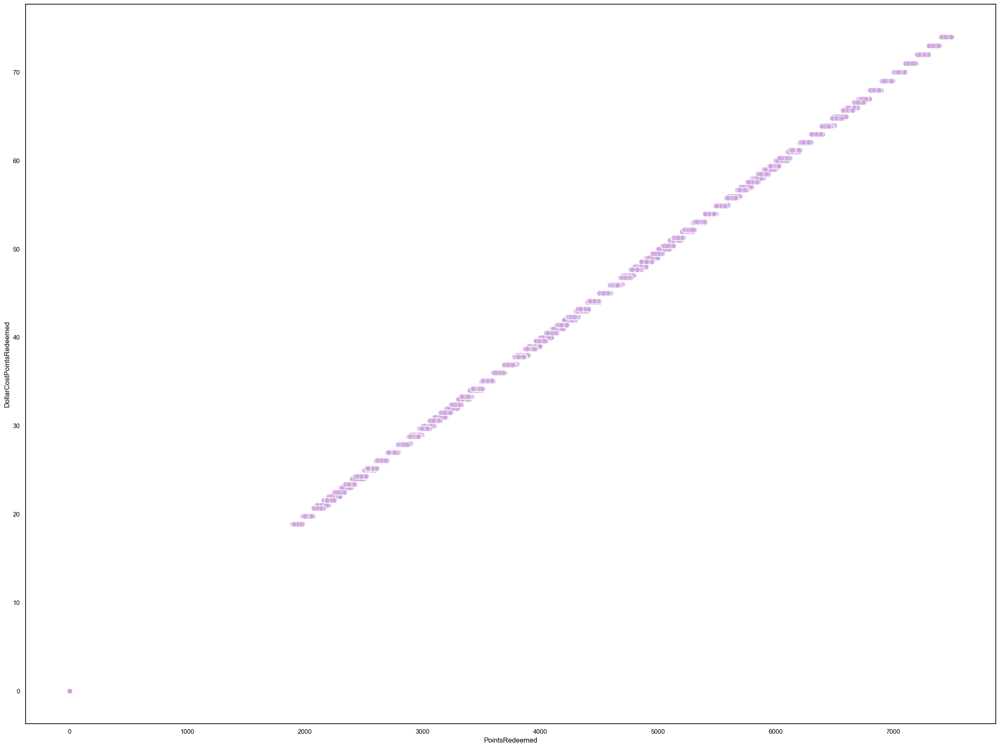

In [455]:
sns.scatterplot(
    data=flightsDB,
    x="PointsRedeemed",
    y="DollarCostPointsRedeemed",
    #"="gastos_mensais", # tamanho do ponto
    alpha=0.7,           # transparência para reduzir sobreposição
    color = "#CDA4DE" ,
    s = 80)

plt.tight_layout()
plt.show()

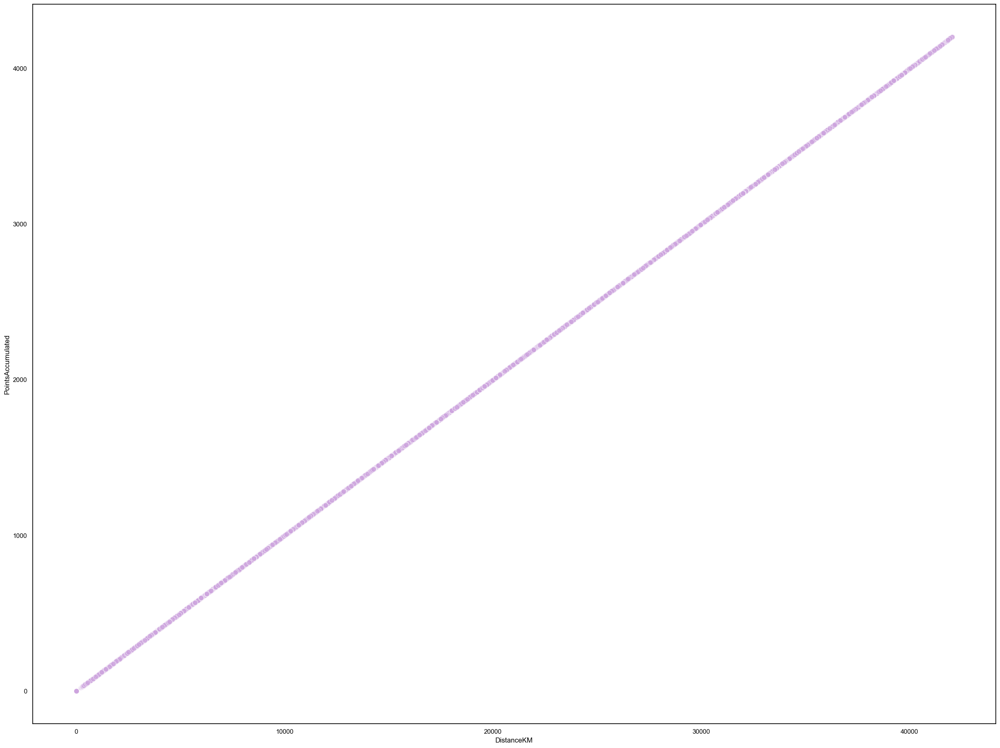

In [456]:
sns.scatterplot(
    data=flightsDB,
    x="DistanceKM",
    y="PointsAccumulated",
    #"="gastos_mensais", # tamanho do ponto
    alpha=0.7,           # transparência para reduzir sobreposição
    color = "#CDA4DE" ,
    s = 80)

plt.tight_layout()
plt.show()

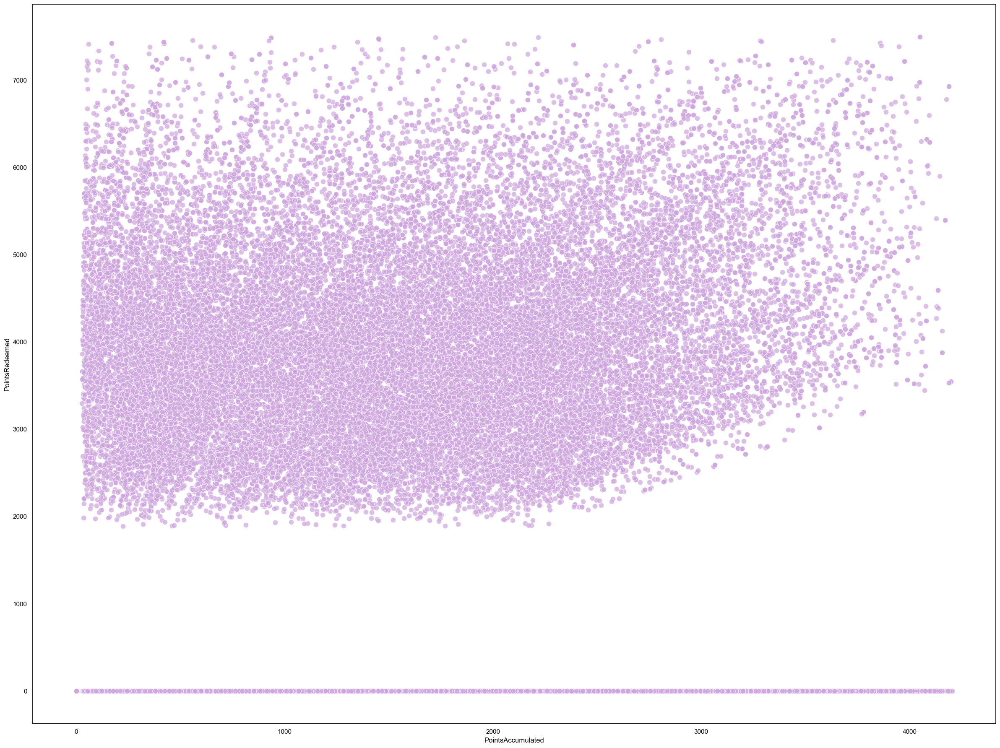

In [457]:
sns.scatterplot(
    data=flightsDB,
    x="PointsAccumulated",
    y="PointsRedeemed",
    #"="gastos_mensais", # tamanho do ponto
    alpha=0.7,           # transparência para reduzir sobreposição
    color = "#CDA4DE" ,
    s = 80)

plt.tight_layout()
plt.show()

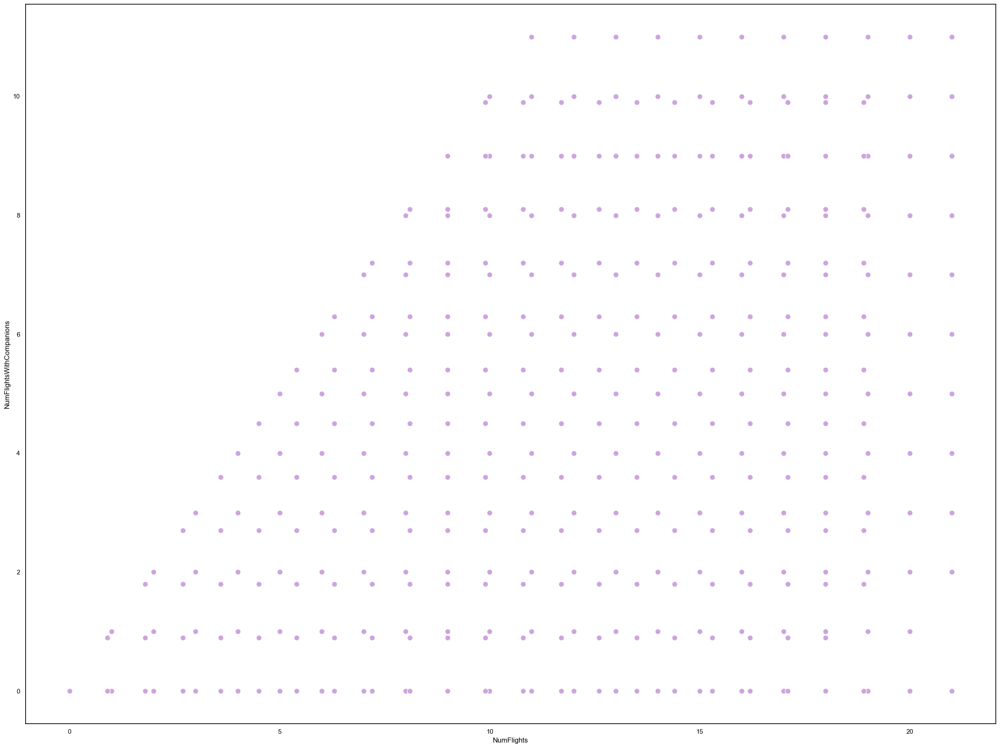

In [458]:
sns.scatterplot(
    data=flightsDB,
    x="NumFlights",
    y="NumFlightsWithCompanions",
    #"="gastos_mensais", # tamanho do ponto
    alpha=0.7,           # transparência para reduzir sobreposição
    color = "#CDA4DE" ,
    s = 80)

plt.tight_layout()
plt.show()

##### **Correlations**

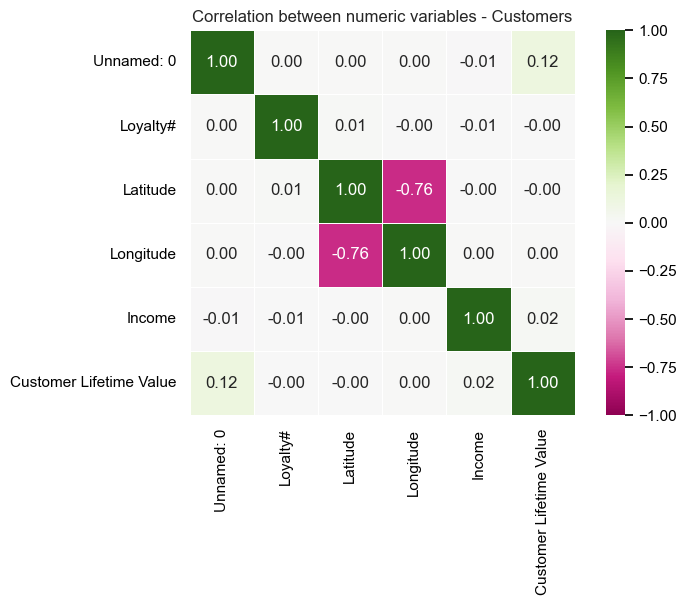

In [459]:
fig = plt.figure(figsize=(8, 5))


# # Plot heatmap of the correlation matrix
sns.heatmap(data=customerDB.corr(numeric_only=True), 
            annot=True, # Specify custom annotation
            fmt='.2f', # The annotation matrix now has strings, so we need to explicitly say this
            vmin=-1, vmax=1, 
            center=0, # Center the colormap at zero
            square=True, # Make each cell square-shaped
            linewidths=.5, # Add lines between cells
            cmap='PiYG' # Diverging color map
            )

plt.title("Correlation between numeric variables - Customers")
plt.show()

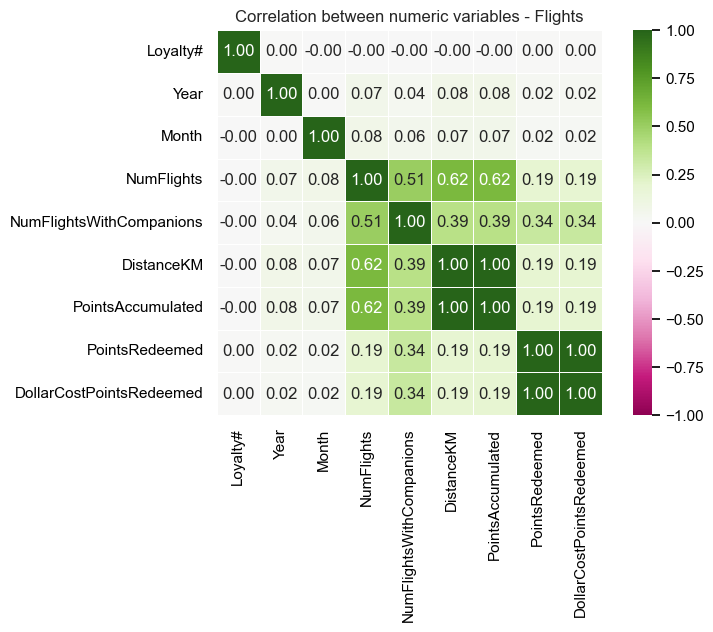

In [460]:
fig = plt.figure(figsize=(8, 5))


# # Plot heatmap of the correlation matrix
sns.heatmap(data=flightsDB.corr(numeric_only=True), 
            annot=True, # Specify custom annotation
            fmt='.2f', # The annotation matrix now has strings, so we need to explicitly say this
            vmin=-1, vmax=1, 
            center=0, # Center the colormap at zero
            square=True, # Make each cell square-shaped
            linewidths=.5, # Add lines between cells
            cmap='PiYG' # Diverging color map
            )

plt.title("Correlation between numeric variables - Flights")
plt.show()

Adicionar correlações entre numericas e categoricas

#### **Feature Engineering**

In [461]:
info_to_merge = flightsDB.groupby('Loyalty#')[['NumFlights', 'NumFlightsWithCompanions', 'PointsAccumulated', 'PointsRedeemed']].sum()

info_to_merge['NumFlights_Max'] = flightsDB.groupby('Loyalty#')[['NumFlights']].max()


info_to_merge = info_to_merge.rename(columns={
    'NumFlights': 'TotalFlights',
    'NumFlightsWithCompanions': 'TotalFlightsWithCompanions',
    'PointsAccumulated': 'TotalPoints',
    'PointsRedeemed': 'TotalPointsRedeemed'})

info_to_merge

,TotalFlights,TotalFlightsWithCompanions,TotalPoints,TotalPointsRedeemed,NumFlights_Max
Loyalty#,,,,,
100018,229.9,49.4,53014.30,20562.8,17.0
100102,247.7,58.2,33903.96,18760.6,15.0
100140,216.8,54.2,43192.58,4896.0,15.0
100214,112.3,19.7,36453.77,12908.6,13.0
100272,186.4,53.1,42953.25,10891.4,16.0
...,...,...,...,...,...
999902,267.1,75.8,61006.55,10501.8,17.0
999911,0.0,0.0,0.00,0.0,0.0
999940,85.5,28.4,23855.59,5620.0,16.0


In [462]:
info_to_merge['Ratio_Flights_Companions'] = info_to_merge['TotalFlightsWithCompanions'] / info_to_merge['TotalFlights']

info_to_merge['Ratio_Points_Redeemed'] = info_to_merge['TotalPointsRedeemed'] / info_to_merge['TotalPoints']

info_to_merge

,TotalFlights,TotalFlightsWithCompanions,TotalPoints,TotalPointsRedeemed,NumFlights_Max,Ratio_Flights_Companions,Ratio_Points_Redeemed
Loyalty#,,,,,,,
100018,229.9,49.4,53014.30,20562.8,17.0,0.214876,0.387873
100102,247.7,58.2,33903.96,18760.6,15.0,0.234962,0.553345
100140,216.8,54.2,43192.58,4896.0,15.0,0.250000,0.113353
100214,112.3,19.7,36453.77,12908.6,13.0,0.175423,0.354109
100272,186.4,53.1,42953.25,10891.4,16.0,0.284871,0.253564
...,...,...,...,...,...,...,...
999902,267.1,75.8,61006.55,10501.8,17.0,0.283789,0.172142
999911,0.0,0.0,0.00,0.0,0.0,NaN,NaN
999940,85.5,28.4,23855.59,5620.0,16.0,0.332164,0.235584


In [463]:
customers_with_flights = flightsDB[flightsDB['NumFlights'] != 0]

mean_distance_per_flight = customers_with_flights.groupby('Loyalty#')['DistanceKM'].sum() / customers_with_flights.groupby('Loyalty#')['NumFlights'].sum()
mean_distance_per_flight.name = 'MeanDistancePerFlight'
mean_distance_per_flight

Loyalty#
100018     2306.350587
100102     1369.053694
100140     1992.761993
100214     3246.675868
100272     2304.884657
              ...     
999891    22119.000000
999902     2284.385998
999940     2690.640936
999982     1874.090909
999986     1857.468245
Name: MeanDistancePerFlight, Length: 15101, dtype: float64

In [464]:
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

flightsDB['Season'] = flightsDB['Month'].apply(get_season)
flightsDB

,Loyalty#,Year,Month,YearMonthDate,NumFlights,NumFlightsWithCompanions,DistanceKM,PointsAccumulated,PointsRedeemed,DollarCostPointsRedeemed,YearMonth,Season
0,413052,2021,12,2021-12-01,2.0,2.0,9384.0,938.00,0.0,0.0,2021-12,Winter
1,464105,2021,12,2021-12-01,0.0,0.0,0.0,0.00,0.0,0.0,2021-12,Winter
2,681785,2021,12,2021-12-01,10.0,3.0,14745.0,1474.00,0.0,0.0,2021-12,Winter
3,185013,2021,12,2021-12-01,16.0,4.0,26311.0,2631.00,3213.0,32.0,2021-12,Winter
4,216596,2021,12,2021-12-01,9.0,0.0,19275.0,1927.00,0.0,0.0,2021-12,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...
608431,999902,2019,12,2019-12-01,7.2,0.0,30766.5,3076.65,0.0,0.0,2019-12,Winter
608432,999911,2019,12,2019-12-01,0.0,0.0,0.0,0.00,0.0,0.0,2019-12,Winter
608433,999940,2019,12,2019-12-01,14.4,0.9,18261.0,1826.10,0.0,0.0,2019-12,Winter
608434,999982,2019,12,2019-12-01,0.0,0.0,0.0,0.00,0.0,0.0,2019-12,Winter


In [465]:
Mode_Season = flightsDB[flightsDB['NumFlights'] != 0].groupby('Loyalty#')['Season'].agg(lambda x: x.mode()[0])
Diversity_Season = flightsDB[flightsDB['NumFlights'] != 0].groupby('Loyalty#')['Season'].nunique()
Diversity_Season

Loyalty#
100018    4
100102    4
100140    4
100214    4
100272    4
         ..
999891    1
999902    4
999940    4
999982    2
999986    4
Name: Season, Length: 15101, dtype: int64

In [466]:
customers_merged = pd.merge(customerDB, info_to_merge, on = 'Loyalty#')
customers_merged = pd.merge(customers_merged, mean_distance_per_flight, on='Loyalty#', how = 'outer')
customers_merged = pd.merge(customers_merged, Mode_Season, on='Loyalty#', how='outer')
customers_merged = pd.merge(customers_merged, Diversity_Season, on='Loyalty#', how='outer')
customers_merged.rename(columns={'DistanceKM': 'MeanDistancePerFlight', 'Season_x': 'MostFrequentSeason', 'Season_y': 'DiversitySeason'}, inplace=True)
customers_merged['MeanDistancePerFlight'] = customers_merged['MeanDistancePerFlight'].fillna(0)
customers_merged['MostFrequentSeason'] = customers_merged['MostFrequentSeason'].fillna('NoFlights')

customers_merged

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,TotalFlights,TotalFlightsWithCompanions,TotalPoints,TotalPointsRedeemed,NumFlights_Max,Ratio_Flights_Companions,Ratio_Points_Redeemed,MeanDistancePerFlight,MostFrequentSeason,DiversitySeason
0,2323,100018,Mina,Smida,Mina Smida,Canada,Alberta,Edmonton,53.544388,-113.490930,...,229.9,49.4,53014.30,20562.8,17.0,0.214876,0.387873,2306.350587,Autumn,4.0
1,4516,100102,Rigoberto,Palacio,Rigoberto Palacio,Canada,Ontario,Toronto,43.653225,-79.383186,...,247.7,58.2,33903.96,18760.6,15.0,0.234962,0.553345,1369.053694,Autumn,4.0
2,4394,100140,Nakesha,Klaass,Nakesha Klaass,Canada,British Columbia,Dawson Creek,55.759628,-120.237660,...,216.8,54.2,43192.58,4896.0,15.0,0.250000,0.113353,1992.761993,Spring,4.0
3,167,100214,Loren,Juenemann,Loren Juenemann,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,112.3,19.7,36453.77,12908.6,13.0,0.175423,0.354109,3246.675868,Autumn,4.0
4,14398,100272,Siobhan,Lander,Siobhan Lander,Canada,Ontario,Toronto,43.653225,-79.383186,...,186.4,53.1,42953.25,10891.4,16.0,0.284871,0.253564,2304.884657,Summer,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16569,2020,999902,Rhoda,Brugliera,Rhoda Brugliera,Canada,Ontario,Toronto,43.653225,-79.383186,...,267.1,75.8,61006.55,10501.8,17.0,0.283789,0.172142,2284.385998,Spring,4.0
16570,8275,999911,Corrinne,Lewison,Corrinne Lewison,Canada,Newfoundland,St. John's,47.561508,-52.712578,...,0.0,0.0,0.00,0.0,0.0,NaN,NaN,0.000000,NoFlights,NaN
16571,9549,999940,Pura,Dejulio,Pura Dejulio,Canada,Quebec,Quebec City,46.813877,-71.207977,...,85.5,28.4,23855.59,5620.0,16.0,0.332164,0.235584,2690.640936,Autumn,4.0
16572,11473,999982,Gladis,Sweeton,Gladis Sweeton,Canada,British Columbia,Victoria,48.428421,-123.365650,...,22.0,2.0,5264.00,0.0,11.0,0.090909,0.000000,1874.090909,Autumn,2.0


In [467]:
customers_merged['ChurnStatus'] = customers_merged['CancellationDate'].apply(
    lambda x: 'Cancelled' if pd.notna(x) else 'Active'
)

customers_merged

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,TotalFlightsWithCompanions,TotalPoints,TotalPointsRedeemed,NumFlights_Max,Ratio_Flights_Companions,Ratio_Points_Redeemed,MeanDistancePerFlight,MostFrequentSeason,DiversitySeason,ChurnStatus
0,2323,100018,Mina,Smida,Mina Smida,Canada,Alberta,Edmonton,53.544388,-113.490930,...,49.4,53014.30,20562.8,17.0,0.214876,0.387873,2306.350587,Autumn,4.0,Active
1,4516,100102,Rigoberto,Palacio,Rigoberto Palacio,Canada,Ontario,Toronto,43.653225,-79.383186,...,58.2,33903.96,18760.6,15.0,0.234962,0.553345,1369.053694,Autumn,4.0,Active
2,4394,100140,Nakesha,Klaass,Nakesha Klaass,Canada,British Columbia,Dawson Creek,55.759628,-120.237660,...,54.2,43192.58,4896.0,15.0,0.250000,0.113353,1992.761993,Spring,4.0,Active
3,167,100214,Loren,Juenemann,Loren Juenemann,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,19.7,36453.77,12908.6,13.0,0.175423,0.354109,3246.675868,Autumn,4.0,Active
4,14398,100272,Siobhan,Lander,Siobhan Lander,Canada,Ontario,Toronto,43.653225,-79.383186,...,53.1,42953.25,10891.4,16.0,0.284871,0.253564,2304.884657,Summer,4.0,Active
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16569,2020,999902,Rhoda,Brugliera,Rhoda Brugliera,Canada,Ontario,Toronto,43.653225,-79.383186,...,75.8,61006.55,10501.8,17.0,0.283789,0.172142,2284.385998,Spring,4.0,Active
16570,8275,999911,Corrinne,Lewison,Corrinne Lewison,Canada,Newfoundland,St. John's,47.561508,-52.712578,...,0.0,0.00,0.0,0.0,NaN,NaN,0.000000,NoFlights,NaN,Active
16571,9549,999940,Pura,Dejulio,Pura Dejulio,Canada,Quebec,Quebec City,46.813877,-71.207977,...,28.4,23855.59,5620.0,16.0,0.332164,0.235584,2690.640936,Autumn,4.0,Active
16572,11473,999982,Gladis,Sweeton,Gladis Sweeton,Canada,British Columbia,Victoria,48.428421,-123.365650,...,2.0,5264.00,0.0,11.0,0.090909,0.000000,1874.090909,Autumn,2.0,Active


In [468]:
Recency = (2021 - flightsDB[flightsDB['NumFlights'] != 0].groupby('Loyalty#')['YearMonthDate'].max().dt.year) * 12 + (12 - flightsDB[flightsDB['NumFlights'] != 0].groupby('Loyalty#')['YearMonthDate'].max().dt.month) 
Recency

Loyalty#
100018     0
100102     0
100140     1
100214     0
100272     1
          ..
999891    23
999902     2
999940     0
999982     1
999986     1
Name: YearMonthDate, Length: 15101, dtype: int32

In [469]:
customers_merged = pd.merge(customers_merged, Recency, on='Loyalty#', how='outer')
customers_merged.rename(columns={'YearMonthDate': 'Recency_Months'}, inplace=True)
customers_merged['Recency_Months'] = customers_merged['Recency_Months'].fillna(-1)  

customers_merged

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,TotalPoints,TotalPointsRedeemed,NumFlights_Max,Ratio_Flights_Companions,Ratio_Points_Redeemed,MeanDistancePerFlight,MostFrequentSeason,DiversitySeason,ChurnStatus,Recency_Months
0,2323,100018,Mina,Smida,Mina Smida,Canada,Alberta,Edmonton,53.544388,-113.490930,...,53014.30,20562.8,17.0,0.214876,0.387873,2306.350587,Autumn,4.0,Active,0.0
1,4516,100102,Rigoberto,Palacio,Rigoberto Palacio,Canada,Ontario,Toronto,43.653225,-79.383186,...,33903.96,18760.6,15.0,0.234962,0.553345,1369.053694,Autumn,4.0,Active,0.0
2,4394,100140,Nakesha,Klaass,Nakesha Klaass,Canada,British Columbia,Dawson Creek,55.759628,-120.237660,...,43192.58,4896.0,15.0,0.250000,0.113353,1992.761993,Spring,4.0,Active,1.0
3,167,100214,Loren,Juenemann,Loren Juenemann,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,36453.77,12908.6,13.0,0.175423,0.354109,3246.675868,Autumn,4.0,Active,0.0
4,14398,100272,Siobhan,Lander,Siobhan Lander,Canada,Ontario,Toronto,43.653225,-79.383186,...,42953.25,10891.4,16.0,0.284871,0.253564,2304.884657,Summer,4.0,Active,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16569,2020,999902,Rhoda,Brugliera,Rhoda Brugliera,Canada,Ontario,Toronto,43.653225,-79.383186,...,61006.55,10501.8,17.0,0.283789,0.172142,2284.385998,Spring,4.0,Active,2.0
16570,8275,999911,Corrinne,Lewison,Corrinne Lewison,Canada,Newfoundland,St. John's,47.561508,-52.712578,...,0.00,0.0,0.0,NaN,NaN,0.000000,NoFlights,NaN,Active,-1.0
16571,9549,999940,Pura,Dejulio,Pura Dejulio,Canada,Quebec,Quebec City,46.813877,-71.207977,...,23855.59,5620.0,16.0,0.332164,0.235584,2690.640936,Autumn,4.0,Active,0.0
16572,11473,999982,Gladis,Sweeton,Gladis Sweeton,Canada,British Columbia,Victoria,48.428421,-123.365650,...,5264.00,0.0,11.0,0.090909,0.000000,1874.090909,Autumn,2.0,Active,1.0


In [470]:
len(customerDB) == len(customers_merged)
# todos os customers têm a info que adicionámos

True

In [471]:
customers_merged['CancellationDate'].isna().sum()

np.int64(14327)

In [472]:
customers_merged['EnrollmentDateOpening_Datetime'] = pd.to_datetime(customers_merged['EnrollmentDateOpening'], dayfirst = False)
customers_merged['CancellationDate_Datetime'] = pd.to_datetime(customers_merged['CancellationDate'], format='mixed', errors='coerce')
customers_merged

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,NumFlights_Max,Ratio_Flights_Companions,Ratio_Points_Redeemed,MeanDistancePerFlight,MostFrequentSeason,DiversitySeason,ChurnStatus,Recency_Months,EnrollmentDateOpening_Datetime,CancellationDate_Datetime
0,2323,100018,Mina,Smida,Mina Smida,Canada,Alberta,Edmonton,53.544388,-113.490930,...,17.0,0.214876,0.387873,2306.350587,Autumn,4.0,Active,0.0,2019-08-09,NaT
1,4516,100102,Rigoberto,Palacio,Rigoberto Palacio,Canada,Ontario,Toronto,43.653225,-79.383186,...,15.0,0.234962,0.553345,1369.053694,Autumn,4.0,Active,0.0,2016-03-09,NaT
2,4394,100140,Nakesha,Klaass,Nakesha Klaass,Canada,British Columbia,Dawson Creek,55.759628,-120.237660,...,15.0,0.250000,0.113353,1992.761993,Spring,4.0,Active,1.0,2019-07-30,NaT
3,167,100214,Loren,Juenemann,Loren Juenemann,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,13.0,0.175423,0.354109,3246.675868,Autumn,4.0,Active,0.0,2018-08-06,NaT
4,14398,100272,Siobhan,Lander,Siobhan Lander,Canada,Ontario,Toronto,43.653225,-79.383186,...,16.0,0.284871,0.253564,2304.884657,Summer,4.0,Active,1.0,2017-01-09,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16569,2020,999902,Rhoda,Brugliera,Rhoda Brugliera,Canada,Ontario,Toronto,43.653225,-79.383186,...,17.0,0.283789,0.172142,2284.385998,Spring,4.0,Active,2.0,2017-05-24,NaT
16570,8275,999911,Corrinne,Lewison,Corrinne Lewison,Canada,Newfoundland,St. John's,47.561508,-52.712578,...,0.0,NaN,NaN,0.000000,NoFlights,NaN,Active,-1.0,2015-08-02,NaT
16571,9549,999940,Pura,Dejulio,Pura Dejulio,Canada,Quebec,Quebec City,46.813877,-71.207977,...,16.0,0.332164,0.235584,2690.640936,Autumn,4.0,Active,0.0,2020-07-25,NaT
16572,11473,999982,Gladis,Sweeton,Gladis Sweeton,Canada,British Columbia,Victoria,48.428421,-123.365650,...,11.0,0.090909,0.000000,1874.090909,Autumn,2.0,Active,1.0,2021-07-06,NaT


In [473]:
customers_merged['CancellationDate_Datetime'].isna().sum()
# 2 dates were invalid and were transformed to NA

np.int64(14329)

In [474]:
# Cases with Enrollment after Cancellation
customers_merged[customers_merged['CancellationDate_Datetime'] < customers_merged['EnrollmentDateOpening_Datetime']]


,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,NumFlights_Max,Ratio_Flights_Companions,Ratio_Points_Redeemed,MeanDistancePerFlight,MostFrequentSeason,DiversitySeason,ChurnStatus,Recency_Months,EnrollmentDateOpening_Datetime,CancellationDate_Datetime
50,2189,102615,Erline,Fellers,Erline Fellers,Canada,Saskatchewan,Regina,50.445210,-104.618900,...,8.0,0.000000,0.000000,2826.000000,Autumn,1.0,Cancelled,2.0,2021-09-16,2019-05-16
65,13181,103362,Darcie,Claverie,Darcie Claverie,Canada,Quebec,Tremblant,46.118462,-74.596184,...,9.0,0.111111,0.000000,1315.555556,Autumn,1.0,Cancelled,1.0,2021-10-31,2019-06-30
81,4228,103985,Grant,Perloff,Grant Perloff,Canada,Ontario,Toronto,43.653225,-79.383186,...,8.0,0.333333,0.000000,2311.944444,Autumn,2.0,Cancelled,0.0,2021-09-01,2019-05-01
298,9123,116562,Palmer,Schremp,Palmer Schremp,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,18.0,0.057143,0.538557,2293.828571,Summer,2.0,Cancelled,0.0,2021-06-20,2019-02-20
414,5396,122858,Emilie,Etienne,Emilie Etienne,Canada,Quebec,Montreal,45.501690,-73.567253,...,13.0,0.218750,0.327063,2542.031250,Autumn,3.0,Cancelled,0.0,2021-05-07,2019-01-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16198,9466,978040,Thersa,Vanier,Thersa Vanier,Canada,British Columbia,Kelowna,49.887951,-119.496010,...,13.0,0.393939,0.861951,2215.666667,Autumn,2.0,Cancelled,1.0,2021-07-27,2019-03-27
16280,4482,982543,Reita,Sumruld,Reita Sumruld,Canada,Ontario,Toronto,43.653225,-79.383186,...,7.0,0.300000,2.329817,1422.900000,Autumn,1.0,Cancelled,1.0,2021-09-11,2019-05-11
16328,9410,985707,Shayna,Sperka,Shayna Sperka,Canada,Quebec,Montreal,45.501690,-73.567253,...,18.0,0.428571,1.341529,1371.482143,Summer,2.0,Cancelled,1.0,2021-05-06,2019-01-06
16442,15379,992499,Derick,Mumma,Derick Mumma,Canada,Ontario,Toronto,43.653225,-79.383186,...,11.0,0.181818,0.000000,2566.000000,Autumn,1.0,Cancelled,3.0,2021-08-02,2019-04-02


The only possible solution to this would be that the dates have been switched or they could have typed it wrong. However since we dont want to lose any costumers info and have no other way to impute this value we will believe the first assumption and switch the dates.

In [475]:
cancel_before_enrol = customers_merged['CancellationDate_Datetime'] < customers_merged['EnrollmentDateOpening_Datetime']
print(f"Number of records with switched dates: {cancel_before_enrol.sum()}")

Number of records with switched dates: 199


In [476]:
customer_merged_problematic = customers_merged.copy()

In [477]:
# Switch the dates
customers_merged.loc[cancel_before_enrol, ['EnrollmentDateOpening_Datetime', 'CancellationDate_Datetime']] = \
    customers_merged.loc[cancel_before_enrol, ['CancellationDate_Datetime', 'EnrollmentDateOpening_Datetime']].values

In [478]:
customers_merged['Analysis_Start_Date'] = customers_merged['EnrollmentDateOpening_Datetime'].apply(
    lambda x: max(x, pd.Timestamp('2019-01-01')) 
)


customers_merged['Analysis_End_Date'] = np.where(
    customers_merged['CancellationDate_Datetime'].notna(),  # has caccellation date
    np.where(
        customers_merged['CancellationDate_Datetime'] < customers_merged['Analysis_Start_Date'],
        customers_merged['Analysis_Start_Date'],  # If the cancelation date is before the Start_Date then use Start_Date
        customers_merged['CancellationDate_Datetime']  # otherwise use the cancellation date
    ),
    pd.Timestamp('2021-12-01')  # if its NaT then use 2021-12-01
)
customers_merged['Analysis_End_Date'] = pd.to_datetime(customers_merged['Analysis_End_Date'])

# Months in the program in the interval of the flights data set
customers_merged['Months_In_Program'] = (
    (customers_merged['Analysis_End_Date'].dt.year - customers_merged['Analysis_Start_Date'].dt.year) * 12 +
    (customers_merged['Analysis_End_Date'].dt.month - customers_merged['Analysis_Start_Date'].dt.month)
)

end_date = pd.Timestamp('2021-12-01')
end_or_cancel = customers_merged['CancellationDate_Datetime'].fillna(end_date)

# Months since enrollment to end or cancellation date
customers_merged['Months_Since_Enrollment'] = (
    (end_or_cancel.dt.year - customers_merged['EnrollmentDateOpening_Datetime'].dt.year) * 12 +
    (end_or_cancel.dt.month - customers_merged['EnrollmentDateOpening_Datetime'].dt.month)
)


In [479]:

customers_merged['PropNrFlights'] = np.where(
    customers_merged['Months_In_Program'] == 0,
    np.nan,  
    customers_merged['TotalFlights'] / customers_merged['Months_In_Program']
)

customers_merged['PropNrFlightsWithCompanions'] = np.where(
    customers_merged['Months_In_Program'] == 0,
    np.nan,  # ou 0, se fizer mais sentido
    customers_merged['TotalFlightsWithCompanions'] / customers_merged['Months_In_Program']
)

customers_merged['PropPoints'] = np.where(
    customers_merged['Months_In_Program'] == 0,
    np.nan,  # ou 0, se fizer mais sentido
    customers_merged['TotalPoints'] / customers_merged['Months_In_Program']
)

customers_merged['PropPointsRedem'] = np.where(
    customers_merged['Months_In_Program'] == 0,
    np.nan,  # ou 0, se fizer mais sentido
    customers_merged['TotalPointsRedeemed'] / customers_merged['Months_In_Program']
)
customers_merged

,Unnamed: 0,Loyalty#,First Name,Last Name,Customer Name,Country,Province or State,City,Latitude,Longitude,...,EnrollmentDateOpening_Datetime,CancellationDate_Datetime,Analysis_Start_Date,Analysis_End_Date,Months_In_Program,Months_Since_Enrollment,PropNrFlights,PropNrFlightsWithCompanions,PropPoints,PropPointsRedem
0,2323,100018,Mina,Smida,Mina Smida,Canada,Alberta,Edmonton,53.544388,-113.490930,...,2019-08-09,NaT,2019-08-09,2021-12-01,28,28,8.210714,1.764286,1893.367857,734.385714
1,4516,100102,Rigoberto,Palacio,Rigoberto Palacio,Canada,Ontario,Toronto,43.653225,-79.383186,...,2016-03-09,NaT,2019-01-01,2021-12-01,35,69,7.077143,1.662857,968.684571,536.017143
2,4394,100140,Nakesha,Klaass,Nakesha Klaass,Canada,British Columbia,Dawson Creek,55.759628,-120.237660,...,2019-07-30,NaT,2019-07-30,2021-12-01,29,29,7.475862,1.868966,1489.399310,168.827586
3,167,100214,Loren,Juenemann,Loren Juenemann,Canada,British Columbia,Vancouver,49.282730,-123.120740,...,2018-08-06,NaT,2019-01-01,2021-12-01,35,40,3.208571,0.562857,1041.536286,368.817143
4,14398,100272,Siobhan,Lander,Siobhan Lander,Canada,Ontario,Toronto,43.653225,-79.383186,...,2017-01-09,NaT,2019-01-01,2021-12-01,35,59,5.325714,1.517143,1227.235714,311.182857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16569,2020,999902,Rhoda,Brugliera,Rhoda Brugliera,Canada,Ontario,Toronto,43.653225,-79.383186,...,2017-05-24,NaT,2019-01-01,2021-12-01,35,55,7.631429,2.165714,1743.044286,300.051429
16570,8275,999911,Corrinne,Lewison,Corrinne Lewison,Canada,Newfoundland,St. John's,47.561508,-52.712578,...,2015-08-02,NaT,2019-01-01,2021-12-01,35,76,0.000000,0.000000,0.000000,0.000000
16571,9549,999940,Pura,Dejulio,Pura Dejulio,Canada,Quebec,Quebec City,46.813877,-71.207977,...,2020-07-25,NaT,2020-07-25,2021-12-01,17,17,5.029412,1.670588,1403.270000,330.588235
16572,11473,999982,Gladis,Sweeton,Gladis Sweeton,Canada,British Columbia,Victoria,48.428421,-123.365650,...,2021-07-06,NaT,2021-07-06,2021-12-01,5,5,4.400000,0.400000,1052.800000,0.000000


In [480]:
customers_merged['CLV_Category'] = pd.cut(
    customers_merged['Customer Lifetime Value'],
    bins=[0, customers_merged['Customer Lifetime Value'].quantile(0.33),
          customers_merged['Customer Lifetime Value'].quantile(0.67),
          customers_merged['Customer Lifetime Value'].quantile(0.95),
          customers_merged['Customer Lifetime Value'].max()],
    labels=['Low', 'Medium', 'High', 'Very High']
)

customers_merged['Income_Category'] = pd.cut(
    customers_merged['Customer Lifetime Value'],
    bins=[0, customers_merged['Customer Lifetime Value'].quantile(0.33),
          customers_merged['Customer Lifetime Value'].quantile(0.67),
          customers_merged['Customer Lifetime Value'].quantile(0.95),
          customers_merged['Customer Lifetime Value'].max()],
    labels=['Low', 'Medium', 'High', 'Very High']
)

In [481]:
customers_merged.columns

Index(['Unnamed: 0', 'Loyalty#', 'First Name', 'Last Name', 'Customer Name',
       'Country', 'Province or State', 'City', 'Latitude', 'Longitude',
       'Postal code', 'Gender', 'Education', 'Location Code', 'Income',
       'Marital Status', 'LoyaltyStatus', 'EnrollmentDateOpening',
       'CancellationDate', 'Customer Lifetime Value', 'EnrollmentType',
       'TotalFlights', 'TotalFlightsWithCompanions', 'TotalPoints',
       'TotalPointsRedeemed', 'NumFlights_Max', 'Ratio_Flights_Companions',
       'Ratio_Points_Redeemed', 'MeanDistancePerFlight', 'MostFrequentSeason',
       'DiversitySeason', 'ChurnStatus', 'Recency_Months',
       'EnrollmentDateOpening_Datetime', 'CancellationDate_Datetime',
       'Analysis_Start_Date', 'Analysis_End_Date', 'Months_In_Program',
       'Months_Since_Enrollment', 'PropNrFlights',
       'PropNrFlightsWithCompanions', 'PropPoints', 'PropPointsRedem',
       'CLV_Category', 'Income_Category'],
      dtype='object')

In [482]:
customers_merged.describe().T

,count,mean,min,25%,50%,75%,max,std
Unnamed: 0,16574.0,8453.300772,0.0,4230.25,8451.5,12677.75,16900.0,4879.509478
Loyalty#,16574.0,549435.680825,100018.0,326235.5,550020.0,771895.75,999986.0,258874.788435
Latitude,16574.0,47.174633,42.984924,44.231171,46.087818,49.28273,60.721188,3.305623
Longitude,16574.0,-91.840494,-135.05684,-120.23766,-79.383186,-74.596184,-52.712578,22.240412
Income,16574.0,37739.986787,0.0,0.0,34137.0,62373.75,99981.0,30355.907587
Customer Lifetime Value,16574.0,7986.494716,1898.01,3978.8225,5780.18,8954.43,83325.38,6858.499179
TotalFlights,16574.0,141.359249,0.0,70.9,162.9,203.1,348.4,80.567681
TotalFlightsWithCompanions,16574.0,35.575703,0.0,16.0,36.8,52.7,124.0,23.423057
TotalPoints,16574.0,28699.318453,0.0,14458.2675,33138.865,41310.4125,71264.46,16343.457707
TotalPointsRedeemed,16574.0,8512.911621,0.0,0.0,6499.95,13546.225,57527.8,8696.202956


#### **Quality Issues**

In [483]:
customers_merged.columns

Index(['Unnamed: 0', 'Loyalty#', 'First Name', 'Last Name', 'Customer Name',
       'Country', 'Province or State', 'City', 'Latitude', 'Longitude',
       'Postal code', 'Gender', 'Education', 'Location Code', 'Income',
       'Marital Status', 'LoyaltyStatus', 'EnrollmentDateOpening',
       'CancellationDate', 'Customer Lifetime Value', 'EnrollmentType',
       'TotalFlights', 'TotalFlightsWithCompanions', 'TotalPoints',
       'TotalPointsRedeemed', 'NumFlights_Max', 'Ratio_Flights_Companions',
       'Ratio_Points_Redeemed', 'MeanDistancePerFlight', 'MostFrequentSeason',
       'DiversitySeason', 'ChurnStatus', 'Recency_Months',
       'EnrollmentDateOpening_Datetime', 'CancellationDate_Datetime',
       'Analysis_Start_Date', 'Analysis_End_Date', 'Months_In_Program',
       'Months_Since_Enrollment', 'PropNrFlights',
       'PropNrFlightsWithCompanions', 'PropPoints', 'PropPointsRedem',
       'CLV_Category', 'Income_Category'],
      dtype='object')

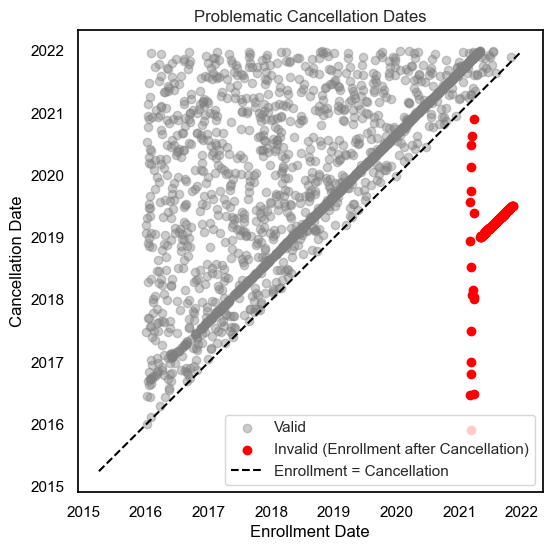

In [484]:
mask_invalid_cancel = customer_merged_problematic['EnrollmentDateOpening_Datetime'] > customer_merged_problematic['CancellationDate_Datetime']

plt.figure(figsize=(6,6))
plt.scatter(customer_merged_problematic.loc[~mask_invalid_cancel, 'EnrollmentDateOpening_Datetime'],
            customer_merged_problematic.loc[~mask_invalid_cancel, 'CancellationDate_Datetime'],
            alpha=0.4, label='Valid', color='gray')
plt.scatter(customer_merged_problematic.loc[mask_invalid_cancel, 'EnrollmentDateOpening_Datetime'],
            customer_merged_problematic.loc[mask_invalid_cancel, 'CancellationDate_Datetime'],
            color='red', label='Invalid (Enrollment after Cancellation)')

# Add diagonal line (where dates are equal)
min_date = min(customer_merged_problematic['EnrollmentDateOpening_Datetime'].min(),
               customer_merged_problematic['CancellationDate_Datetime'].min())
max_date = max(customer_merged_problematic['EnrollmentDateOpening_Datetime'].max(),
               customer_merged_problematic['CancellationDate_Datetime'].max())

plt.plot([min_date, max_date], [min_date, max_date], color='black', linestyle='--', label='Enrollment = Cancellation')

plt.xlabel('Enrollment Date')
plt.ylabel('Cancellation Date')
plt.title('Problematic Cancellation Dates')
plt.legend()
plt.show()


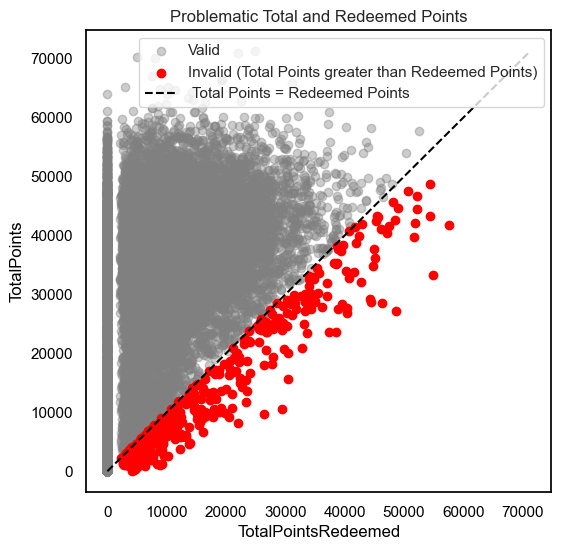

In [485]:
mask_invalid_points = customer_merged_problematic['TotalPoints'] < customer_merged_problematic['TotalPointsRedeemed']

plt.figure(figsize=(6,6))
plt.scatter(customers_merged.loc[~mask_invalid_points, 'TotalPointsRedeemed'],
            customers_merged.loc[~mask_invalid_points, 'TotalPoints'],
            alpha=0.4, label='Valid', color='gray')
plt.scatter(customers_merged.loc[mask_invalid_points, 'TotalPointsRedeemed'],
            customers_merged.loc[mask_invalid_points, 'TotalPoints'],
            color='red', label='Invalid (Total Points greater than Redeemed Points)')

# Add diagonal line (where dates are equal)
min_points = min(customer_merged_problematic['TotalPointsRedeemed'].min(),
               customer_merged_problematic['TotalPoints'].min())
max_points = max(customer_merged_problematic['TotalPointsRedeemed'].max(),
               customer_merged_problematic['TotalPoints'].max())

plt.plot([min_points, max_points], [min_points, max_points], color='black', linestyle='--', label=' Total Points = Redeemed Points')

plt.xlabel('TotalPointsRedeemed')
plt.ylabel('TotalPoints')
plt.title('Problematic Total and Redeemed Points')
plt.legend()
plt.show()




c:\Users\35191\anaconda3\envs\Fall2526\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


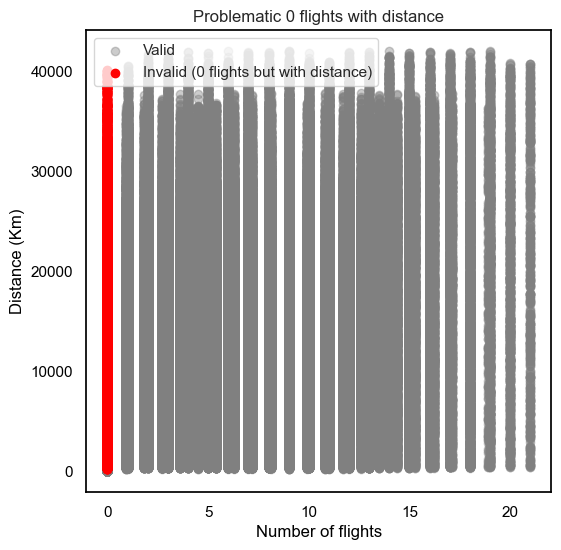

In [486]:
mask_flight_dist = (flightsDB['DistanceKM'] != 0) & (flightsDB['NumFlights'] == 0)

plt.figure(figsize=(6,6))
plt.scatter(flightsDB.loc[~mask_flight_dist, 'NumFlights'],
            flightsDB.loc[~mask_flight_dist, 'DistanceKM'],
            alpha=0.4, label='Valid', color='gray')
plt.scatter(flightsDB.loc[mask_flight_dist, 'NumFlights'],
            flightsDB.loc[mask_flight_dist, 'DistanceKM'],
            color='red', label='Invalid (0 flights but with distance)')

plt.xlabel('Number of flights')
plt.ylabel('Distance (Km)')
plt.title('Problematic 0 flights with distance')
plt.legend()
plt.show()

#### **Multivariate Relationships**

In [487]:
customers_merged.columns

Index(['Unnamed: 0', 'Loyalty#', 'First Name', 'Last Name', 'Customer Name',
       'Country', 'Province or State', 'City', 'Latitude', 'Longitude',
       'Postal code', 'Gender', 'Education', 'Location Code', 'Income',
       'Marital Status', 'LoyaltyStatus', 'EnrollmentDateOpening',
       'CancellationDate', 'Customer Lifetime Value', 'EnrollmentType',
       'TotalFlights', 'TotalFlightsWithCompanions', 'TotalPoints',
       'TotalPointsRedeemed', 'NumFlights_Max', 'Ratio_Flights_Companions',
       'Ratio_Points_Redeemed', 'MeanDistancePerFlight', 'MostFrequentSeason',
       'DiversitySeason', 'ChurnStatus', 'Recency_Months',
       'EnrollmentDateOpening_Datetime', 'CancellationDate_Datetime',
       'Analysis_Start_Date', 'Analysis_End_Date', 'Months_In_Program',
       'Months_Since_Enrollment', 'PropNrFlights',
       'PropNrFlightsWithCompanions', 'PropPoints', 'PropPointsRedem',
       'CLV_Category', 'Income_Category'],
      dtype='object')

In [488]:
customers_merged_categorical = ['Province or State', 'City', 'Gender', 'Education', 'Marital Status', 'LoyaltyStatus', 'EnrollmentType', 'MostFrequentSeason', 'ChurnStatus', 'CLV_Category', 'Income_Category', 'DiversitySeason']
customers_merged_numerical = ['Income', 'Customer Lifetime Value', 'TotalFlights', 'TotalFlightsWithCompanions', 'TotalPoints', 'TotalPointsRedeemed', 'NumFlights_Max', 'Ratio_Flights_Companions', 'Ratio_Points_Redeemed', 'MeanDistancePerFlight', 'Recency_Months', 'Months_In_Program', 'Months_Since_Enrollment', 'PropNrFlights', 'PropNrFlightsWithCompanions', 'PropPoints', 'PropPointsRedem']

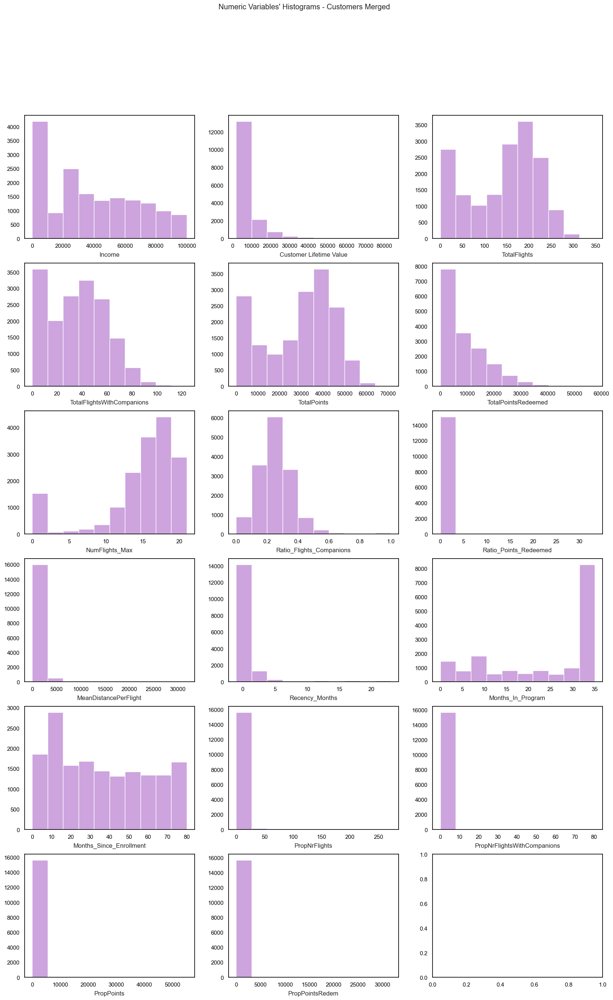

In [489]:
fig, axes = plt.subplots(6, ceil(len(customers_merged_numerical) / 6), figsize=(20, 30))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), customers_merged_numerical): # Notice the zip() function and flatten() method
    ax.hist(customers_merged[feat], color = '#CDA4DE')
    ax.set_title(feat, y=-0.17)
    


plt.suptitle("Numeric Variables' Histograms - Customers Merged")

plt.show()

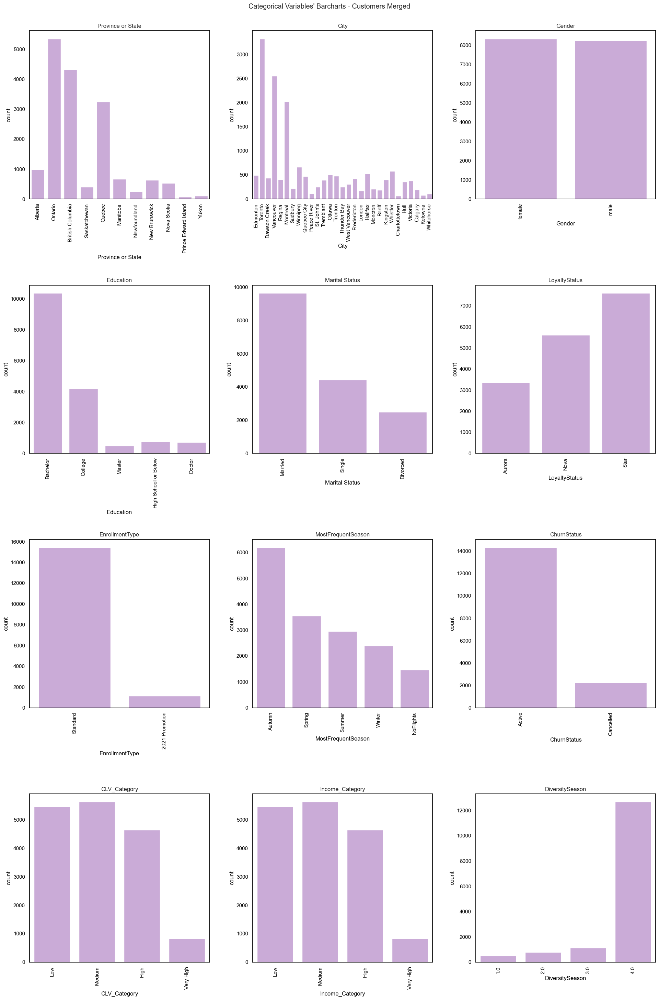

In [490]:
fig, axes = plt.subplots(4, ceil(len(customers_merged_categorical) / 4), figsize=(20, 30))



for ax, feat in zip(axes.flatten(), customers_merged_categorical):
    sns.countplot(x=customers_merged[feat], ax=ax, color='#CDA4DE')
    ax.set_title(feat)
    ax.tick_params(axis='x', rotation=90)

for ax in axes[len(customers_merged_categorical):]:
    ax.set_visible(False)



# Add a centered title to the figure:
plt.suptitle("Categorical Variables' Barcharts - Customers Merged")
plt.tight_layout(pad=3.0)
plt.show()

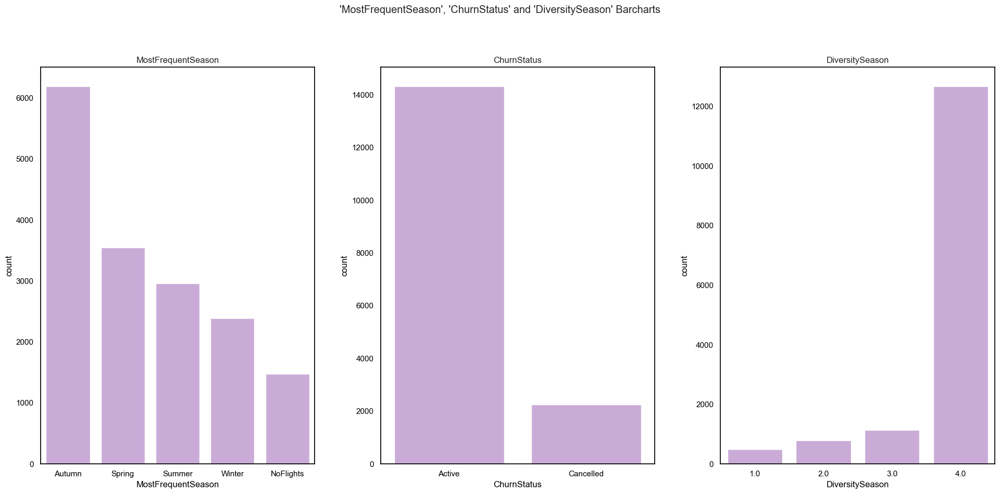

In [491]:
fig, axes = plt.subplots(1, 3, figsize=(20, 10))



for ax, feat in zip(axes.flatten(), ['MostFrequentSeason', 'ChurnStatus', 'DiversitySeason']):
    sns.countplot(x=customers_merged[feat], ax=ax, color='#CDA4DE')
    ax.set_title(feat)


# Add a centered title to the figure:
plt.suptitle("'MostFrequentSeason', 'ChurnStatus' and 'DiversitySeason' Barcharts")
plt.tight_layout(pad=3.0)
plt.show()

The majority of the costumers is Active, travels in all seasons, and travels more in Autumn

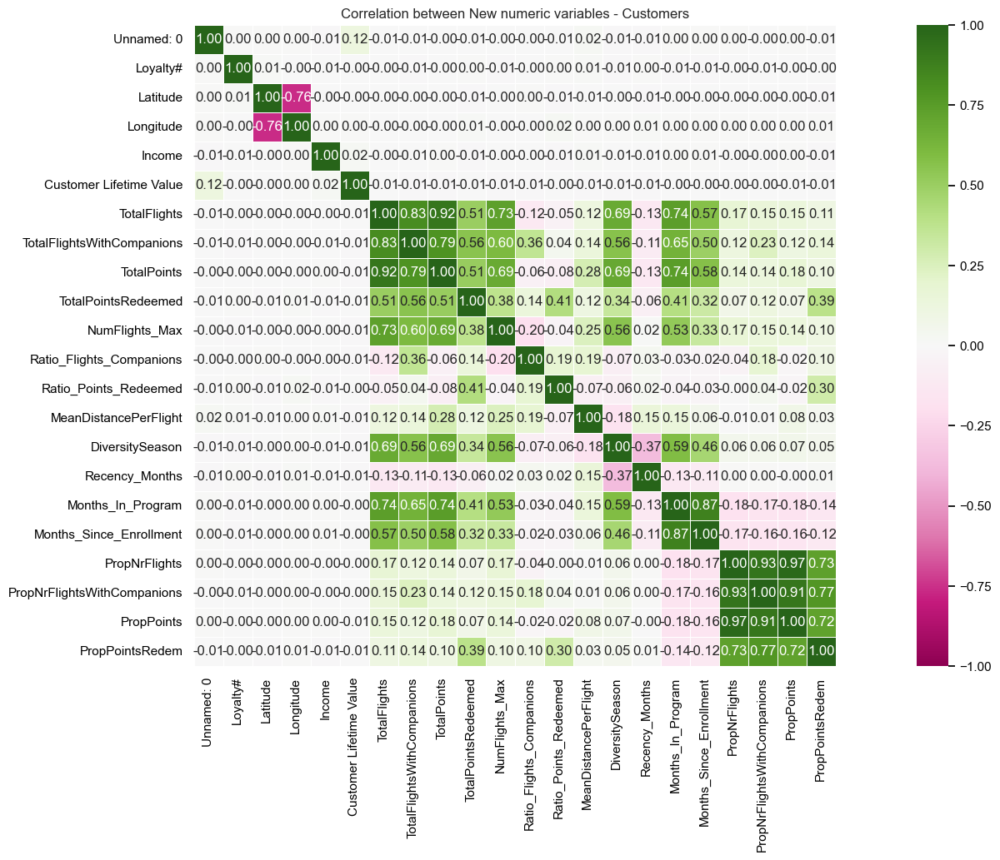

In [492]:
fig = plt.figure(figsize=(25, 10))


# # Plot heatmap of the correlation matrix
sns.heatmap(data=customers_merged.corr(numeric_only=True), 
            annot=True, # Specify custom annotation
            fmt='.2f', # The annotation matrix now has strings, so we need to explicitly say this
            vmin=-1, vmax=1, 
            center=0, # Center the colormap at zero
            square=True, # Make each cell square-shaped
            linewidths=.5, # Add lines between cells
            cmap='PiYG' # Diverging color map
            )

plt.title("Correlation between New numeric variables - Customers")
plt.show()

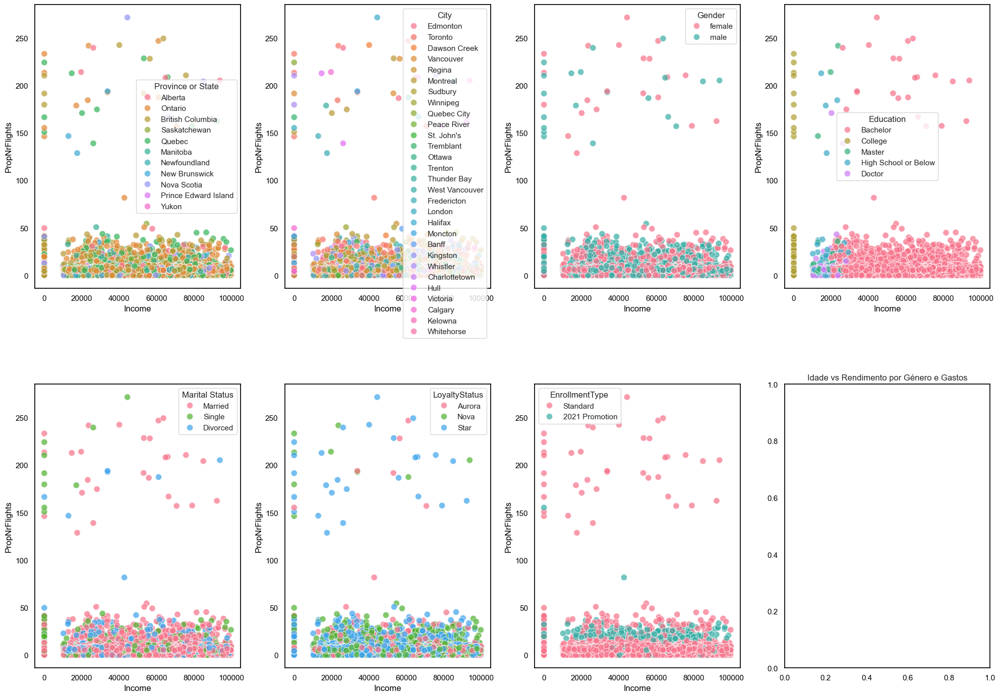

In [493]:

fig, axes = plt.subplots(2, ceil(len(customers_categorical) / 2 ), figsize = (20,14))



for ax, feat in zip(axes.flatten(), customers_categorical):
    sns.scatterplot(
    data=customers_merged,
    x="Income",
    y="PropNrFlights",
    hue=feat,     
    alpha=0.7,         
    palette="husl" ,
    s = 80,
    ax = ax     
)



plt.title("Idade vs Rendimento por Género e Gastos")
plt.tight_layout()
plt.show()

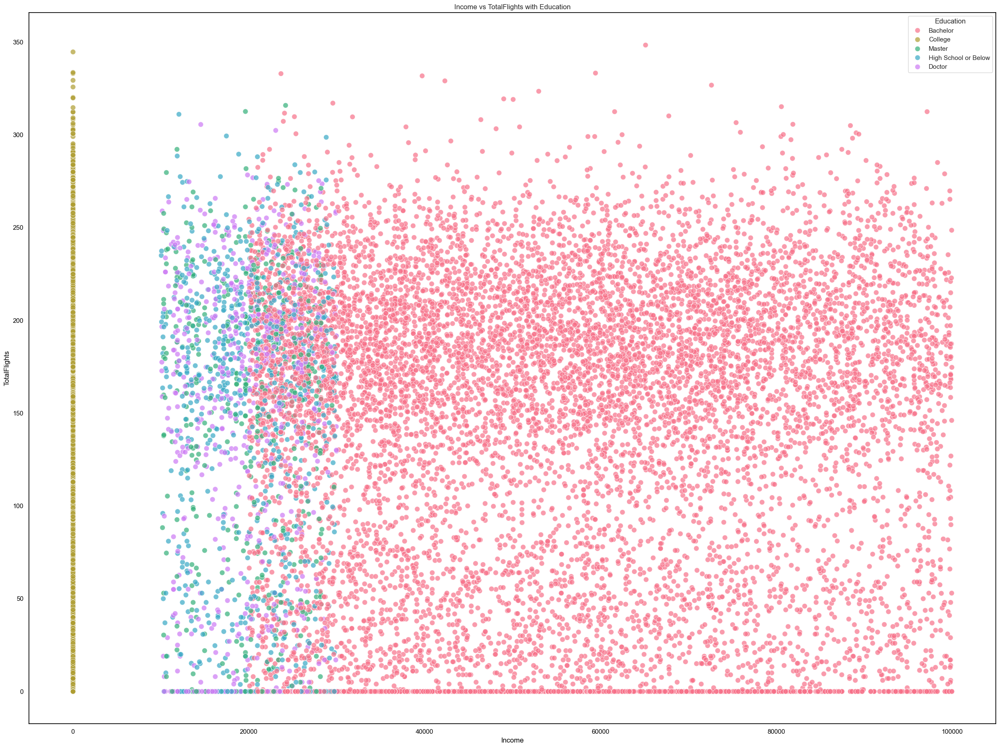

In [494]:
sns.scatterplot(
    data=customers_merged,
    x="Income",
    y="TotalFlights",
    hue="Education",       
    alpha=0.7,         
    palette="husl" ,
    s = 80     
)

plt.title("Income vs TotalFlights with Education")
plt.tight_layout()
plt.show()

We can see that all the customers with 0 income have College as the highest educational level. In canda college is a preperatory school for university, this means that these customers are all probably stil in university. We can see that from 30000 income and up we only have customers with only a bachelor degree, between 10000 and 30000 there is a mixture between Master, Doctor and High School. The income and the education doesent seem to affect the number of flights.

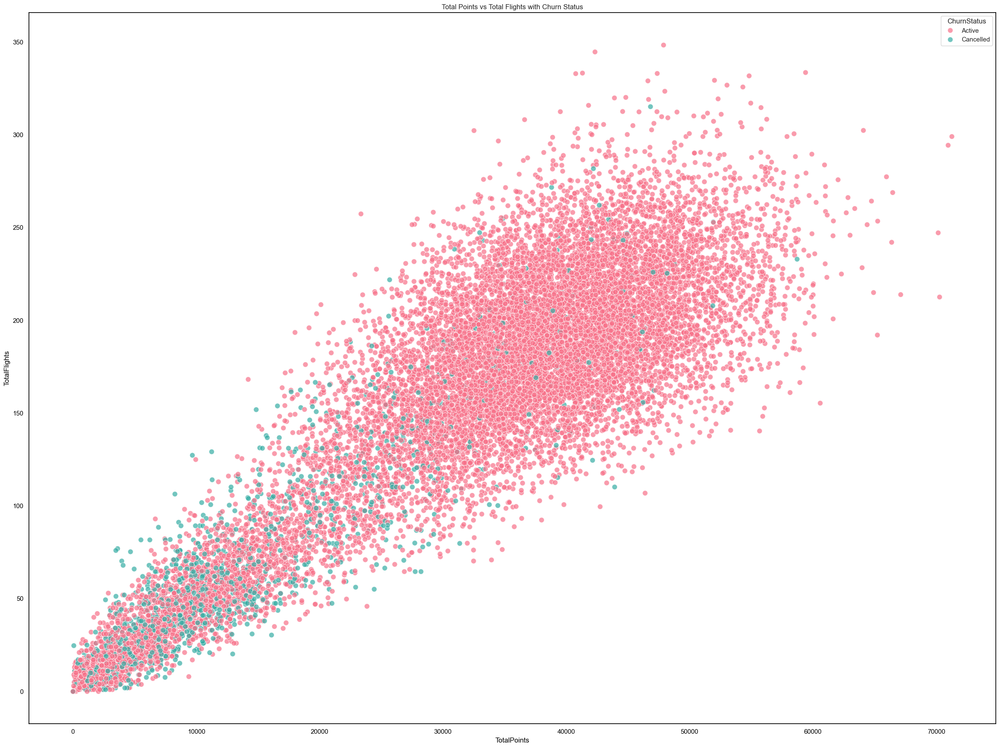

In [495]:
sns.scatterplot(
    data=customers_merged,
    x="TotalPoints",
    y="TotalFlights", 
    hue="ChurnStatus",        
    alpha=0.7,        
    palette="husl" ,
    s = 80     
)

plt.title("Total Points vs Total Flights with Churn Status")
plt.tight_layout()
plt.show()

C:\Users\35191\AppData\Local\Temp\ipykernel_27376\1055975567.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


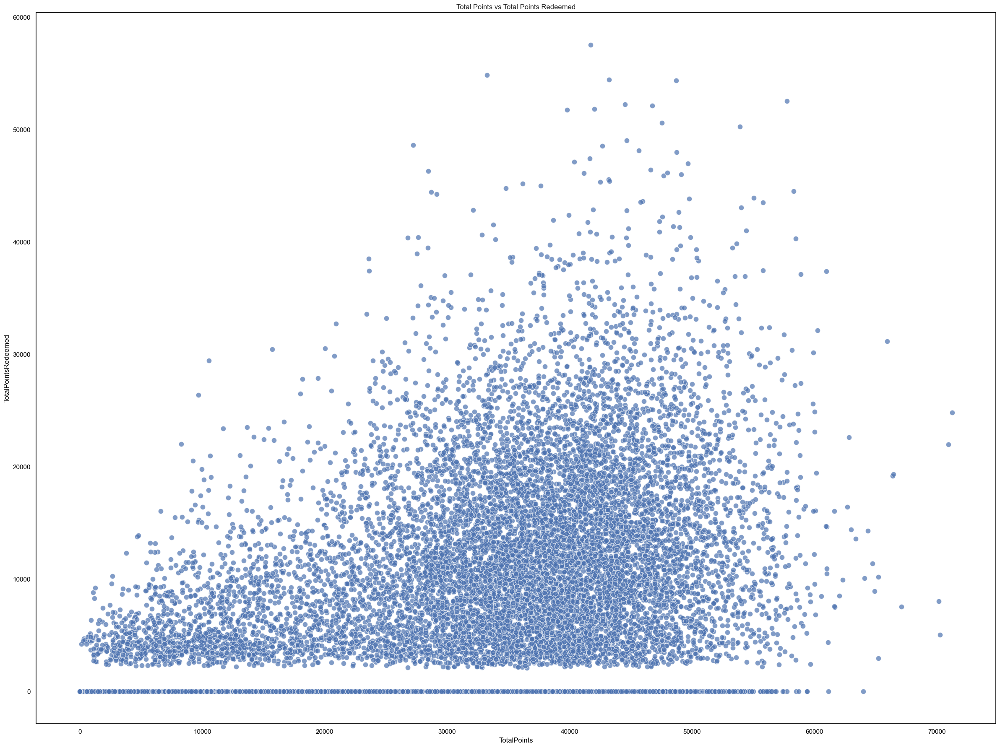

In [496]:
sns.scatterplot(
    data=customers_merged,
    x="TotalPoints",
    y="TotalPointsRedeemed", 
    alpha=0.7,        
    palette="husl" ,
    s = 80     
)

plt.title("Total Points vs Total Points Redeemed")
plt.tight_layout()
plt.show()

There are customers who despite having accumulated points dont redeem them

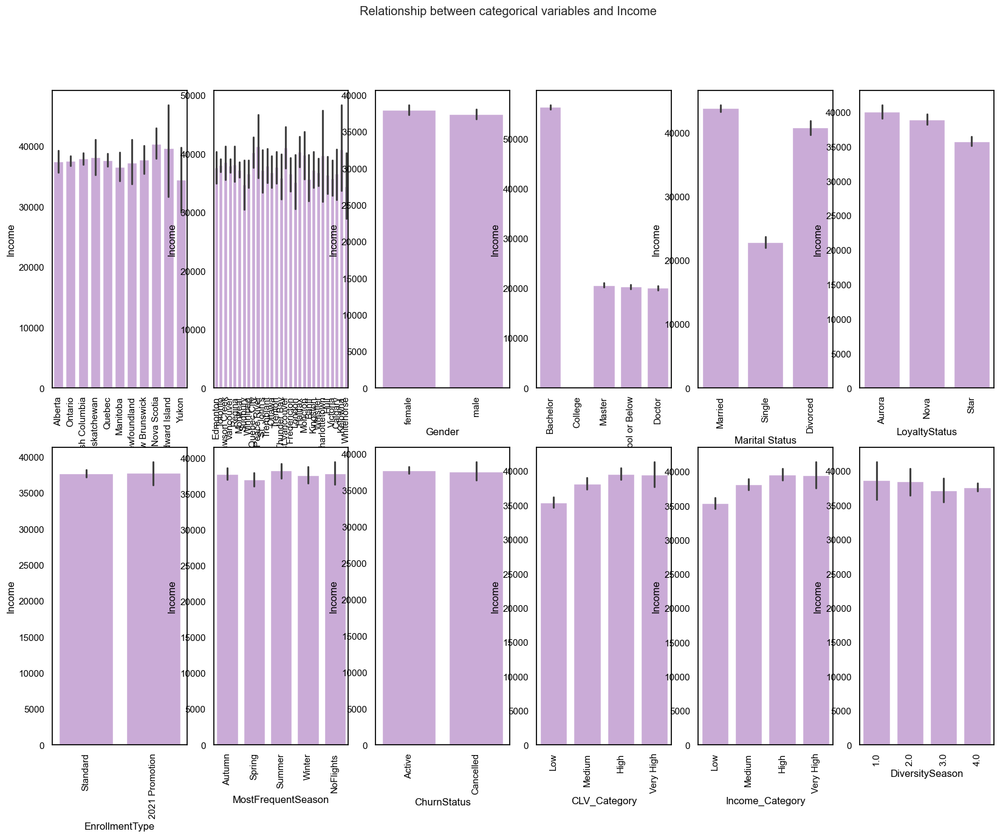

In [497]:

fig, axes = plt.subplots(2, ceil(len(customers_merged_categorical) / 2 ), figsize = (20,14))



for ax, feat in zip(axes.flatten(), customers_merged_categorical):
    sns.barplot(x=feat, y='Income', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between categorical variables and Income")
plt.show()



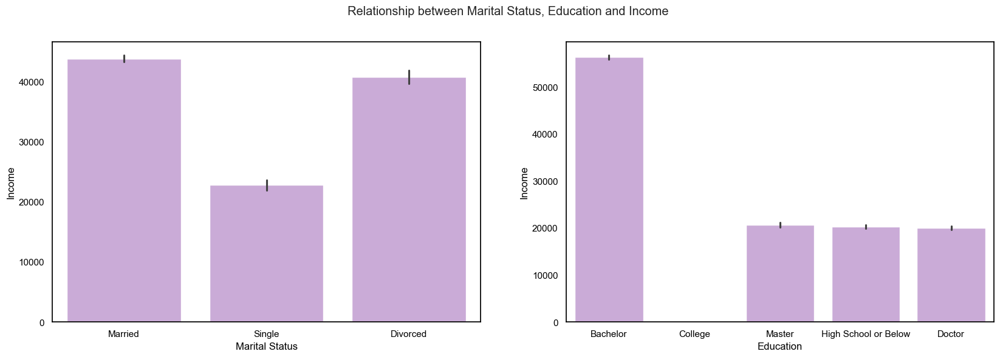

In [498]:
fig, axes = plt.subplots(1, 2, figsize = (20,6))



for ax, feat in zip(axes.flatten(), ['Marital Status', 'Education']):
    sns.barplot(x=feat, y='Income', data = customers_merged, color = '#CDA4DE', ax = ax)



# Add a centered title to the figure:
plt.suptitle("Relationship between Marital Status, Education and Income")
plt.show()


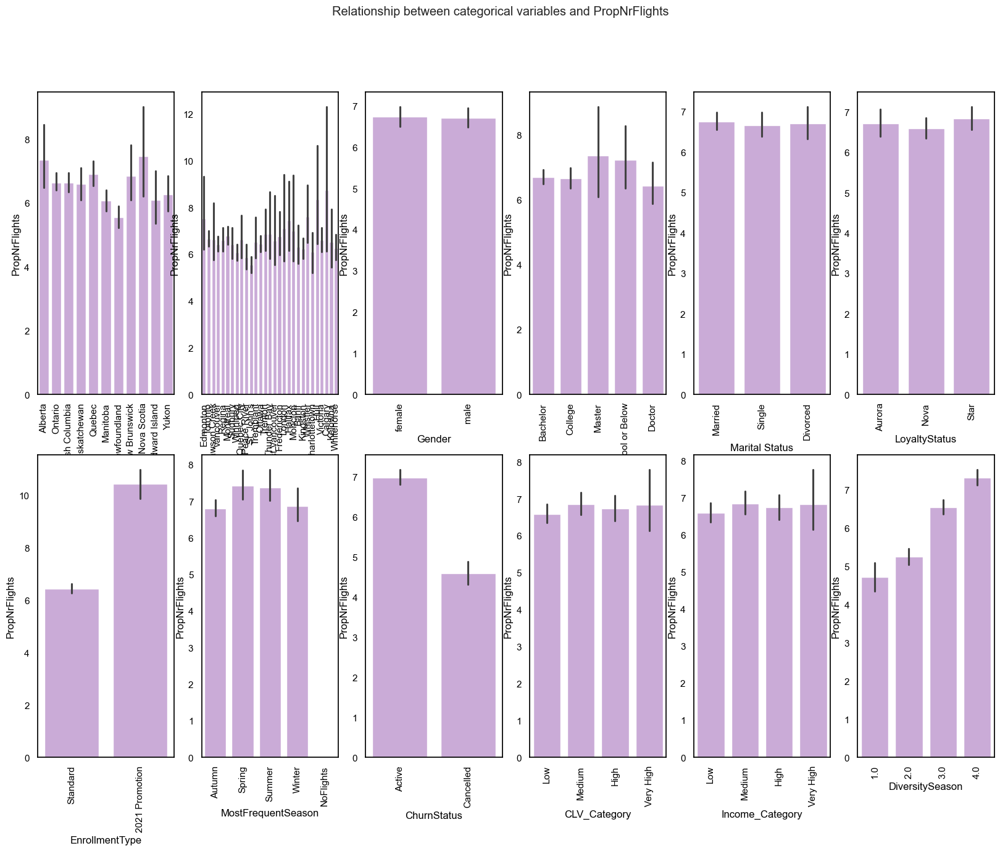

In [499]:

fig, axes = plt.subplots(2, ceil(len(customers_merged_categorical) / 2 ), figsize = (20,14))



for ax, feat in zip(axes.flatten(), customers_merged_categorical):
    sns.barplot(x=feat, y='PropNrFlights', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between categorical variables and PropNrFlights")
plt.show()

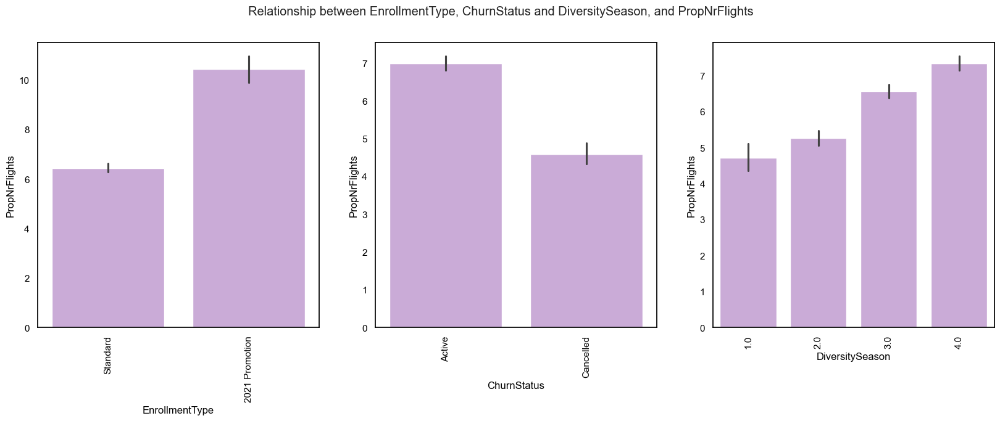

In [500]:
fig, axes = plt.subplots(1,3, figsize = (20,6))



for ax, feat in zip(axes.flatten(), ['EnrollmentType','ChurnStatus', 'DiversitySeason']):
    sns.barplot(x=feat, y='PropNrFlights', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between EnrollmentType, ChurnStatus and DiversitySeason, and PropNrFlights")
plt.show()

We can see that the clients who fly the most are the one that enrolled in the 2021 Promotion and that travel in all Seasons. The bigger the number of seasons with trips the bigger the proportion of flights per month

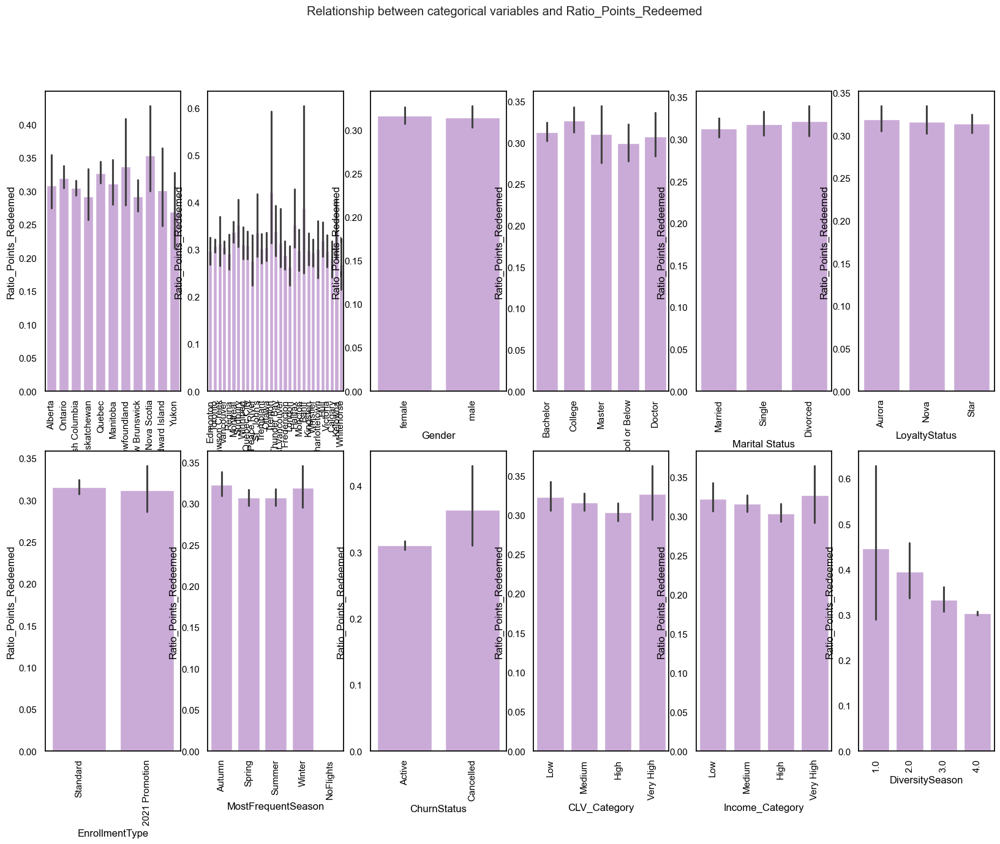

In [501]:

fig, axes = plt.subplots(2, ceil(len(customers_merged_categorical) / 2 ), figsize = (20,14))



for ax, feat in zip(axes.flatten(), customers_merged_categorical):
    sns.barplot(x=feat, y='Ratio_Points_Redeemed', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between categorical variables and Ratio_Points_Redeemed")
plt.show()

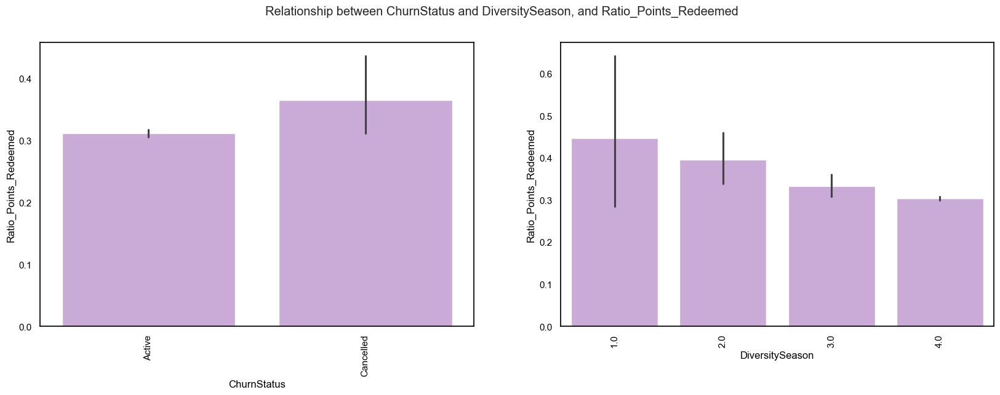

In [502]:
fig, axes = plt.subplots(1,2, figsize = (20,6))



for ax, feat in zip(axes.flatten(), ['ChurnStatus', 'DiversitySeason']):
    sns.barplot(x=feat, y='Ratio_Points_Redeemed', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between ChurnStatus and DiversitySeason, and Ratio_Points_Redeemed")
plt.show()

Comportamental segmentation: Customers who tend to travel only on one or two seasons, tend to redeem a big part of the points. Also they tend to flight less on average per month. 

Clients who have cancelled redeemed more points on average than the ones still active 

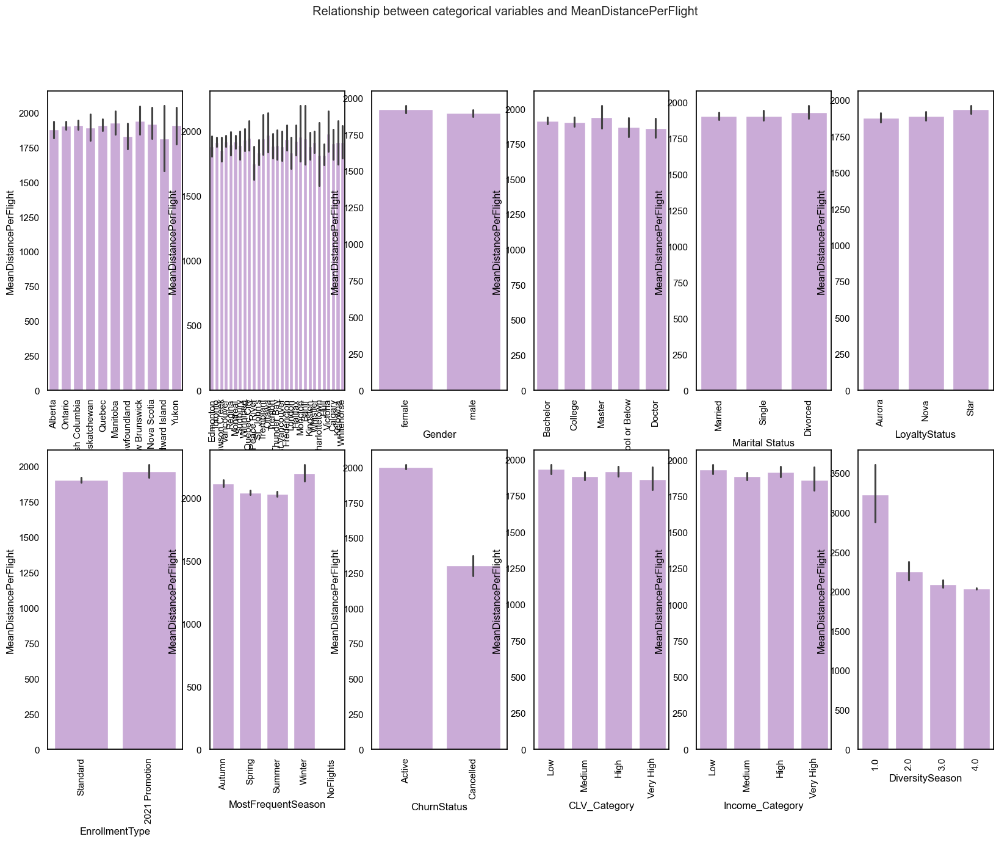

In [503]:

fig, axes = plt.subplots(2, ceil(len(customers_merged_categorical) / 2 ), figsize = (20,14))



for ax, feat in zip(axes.flatten(), customers_merged_categorical):
    sns.barplot(x=feat, y='MeanDistancePerFlight', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between categorical variables and MeanDistancePerFlight")
plt.show()

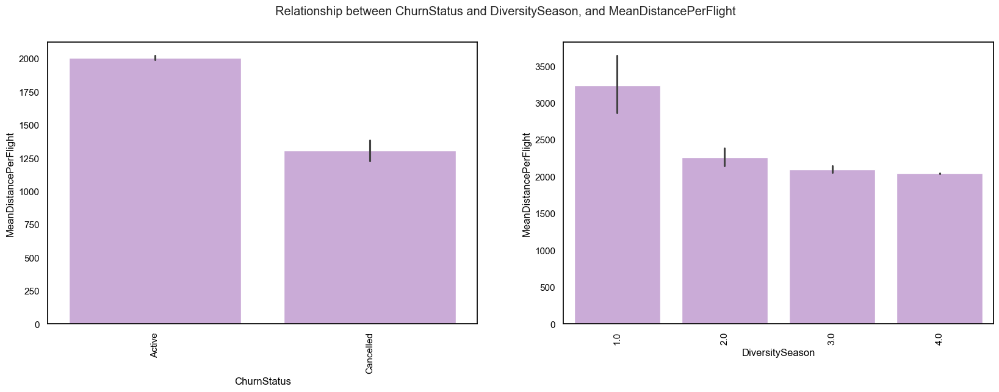

In [504]:
fig, axes = plt.subplots(1,2, figsize = (20,6))



for ax, feat in zip(axes.flatten(), ['ChurnStatus', 'DiversitySeason']):
    sns.barplot(x=feat, y='MeanDistancePerFlight', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between ChurnStatus and DiversitySeason, and MeanDistancePerFlight")
plt.show()

Those who travel only one Season do more distance trips, Redeem more points but go  on less flights.
The customers who have cancelled on average go on shorter distanced trips, Redeem more points and go on fewer trips


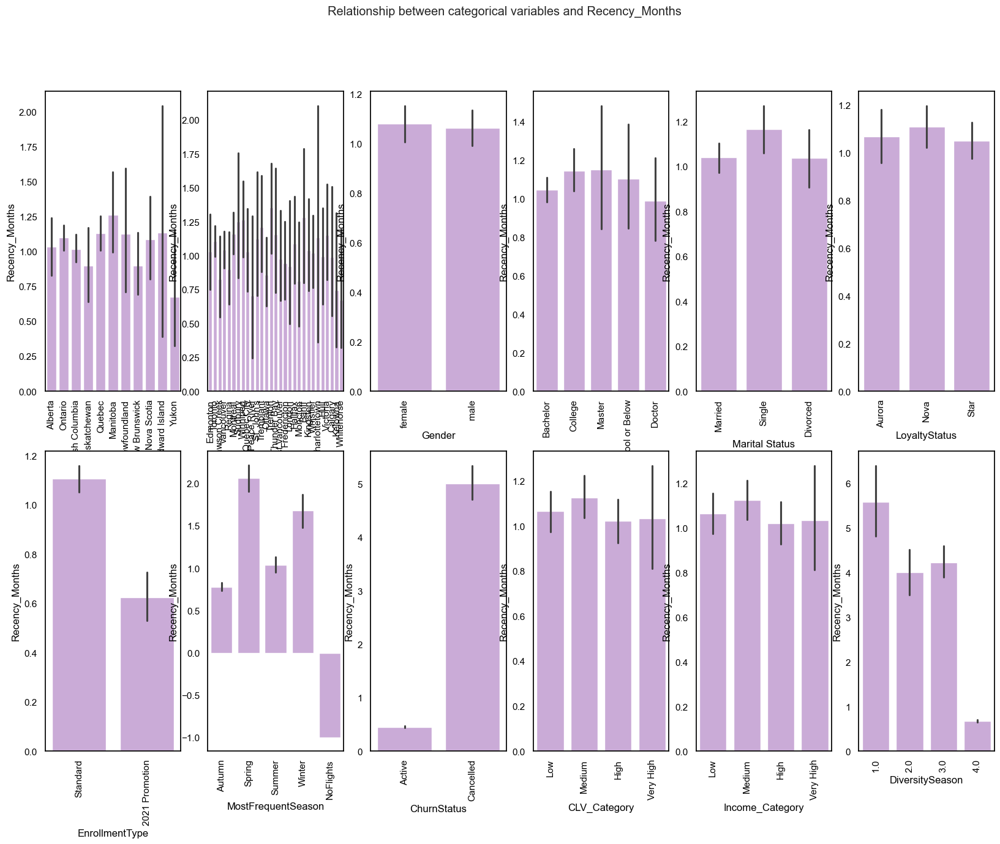

In [505]:
fig, axes = plt.subplots(2, ceil(len(customers_merged_categorical) / 2 ), figsize = (20,14))



for ax, feat in zip(axes.flatten(), customers_merged_categorical):
    sns.barplot(x=feat, y='Recency_Months', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between categorical variables and Recency_Months")
plt.show()

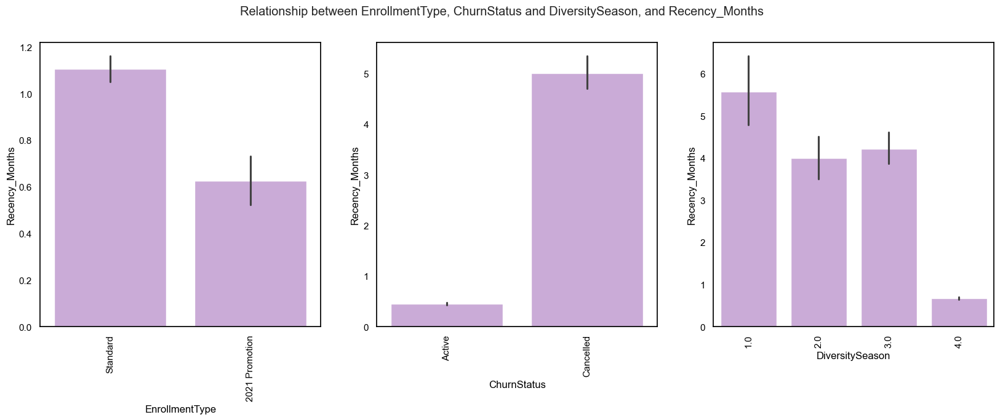

In [506]:
fig, axes = plt.subplots(1,3, figsize = (20,6))



for ax, feat in zip(axes.flatten(), ['EnrollmentType','ChurnStatus', 'DiversitySeason']):
    sns.barplot(x=feat, y='Recency_Months', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between EnrollmentType, ChurnStatus and DiversitySeason, and Recency_Months")
plt.show()

The ones who have enrolled in the 2021 Promotion have on average travelled more recently. This makes a lot of sense since the end date is in 2021 and they have a bigger proportion of flights per month since enrolment.

Those who have canceled have travelled much more recently than active customers WEIRD


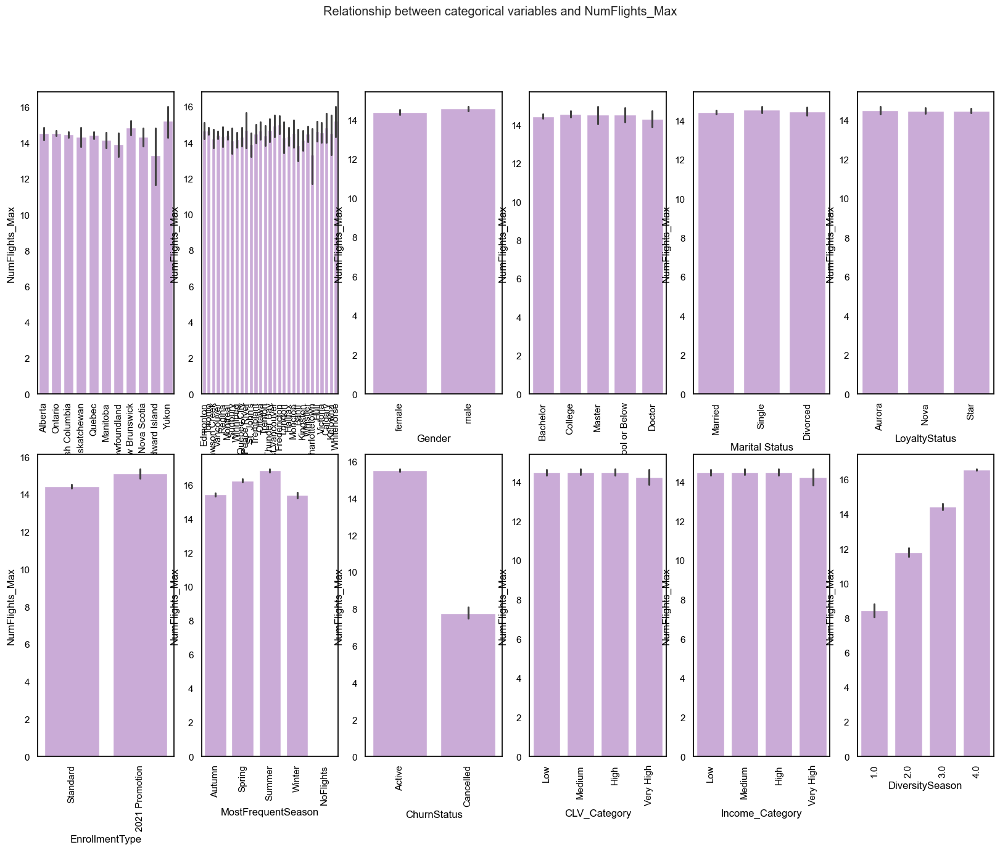

In [507]:
fig, axes = plt.subplots(2, ceil(len(customers_merged_categorical) / 2 ), figsize = (20,14))



for ax, feat in zip(axes.flatten(), customers_merged_categorical):
    sns.barplot(x=feat, y='NumFlights_Max', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between categorical variables and NumFlights_Max")
plt.show()

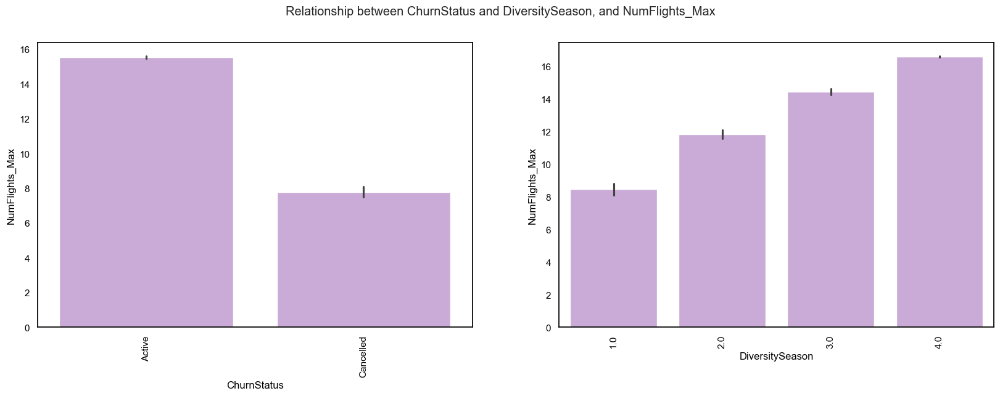

In [508]:
fig, axes = plt.subplots(1,2, figsize = (20,6))



for ax, feat in zip(axes.flatten(), ['ChurnStatus', 'DiversitySeason']):
    sns.barplot(x=feat, y='NumFlights_Max', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between ChurnStatus and DiversitySeason, and NumFlights_Max")
plt.show()

Customers who travel only during one or two seasons don’t travel a lot in the same month on average, do more distance trips, Redeem more points when they have accumulated points but go  on less flights.

The customers who have cancelled on average go on shorter distanced trips, Redeem more points and go on fewer trips, and the maximum number os flights in a month is smaller.

Active customers go on more far away trips, have a higher number of flights in a month, go on more trips on average per month but from the points accumulated, redeem less.


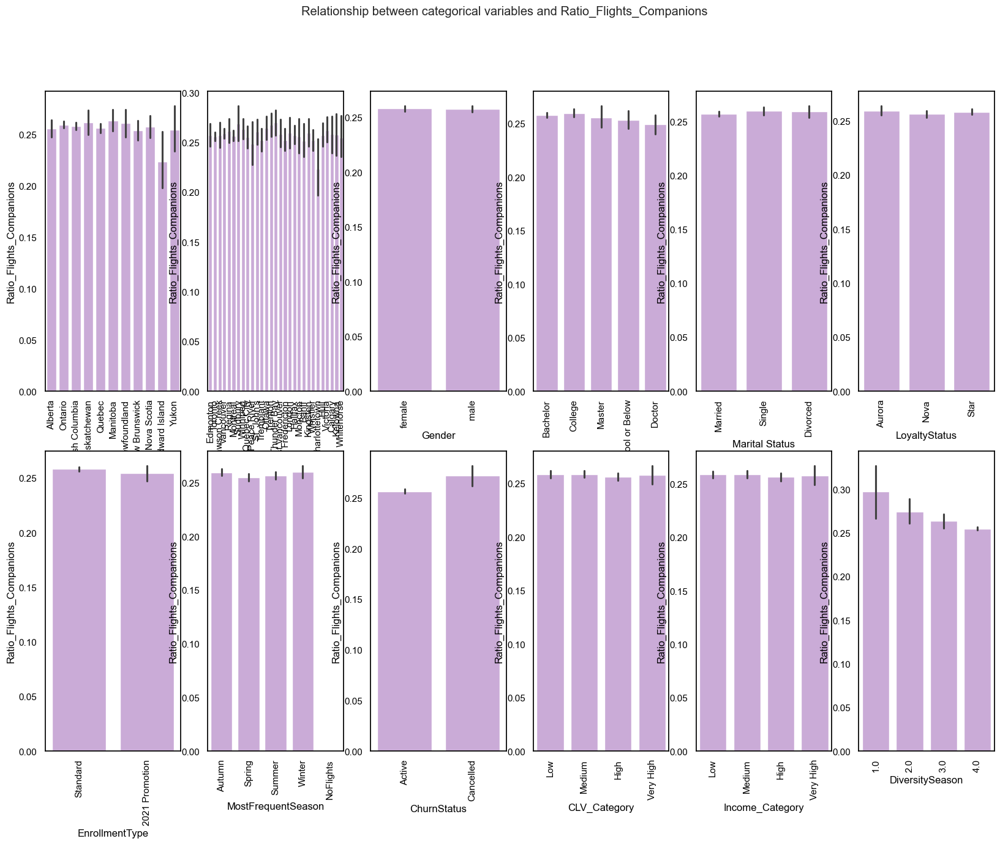

In [509]:
fig, axes = plt.subplots(2, ceil(len(customers_merged_categorical) / 2 ), figsize = (20,14))



for ax, feat in zip(axes.flatten(), customers_merged_categorical):
    sns.barplot(x=feat, y='Ratio_Flights_Companions', data = customers_merged, color = '#CDA4DE', ax = ax)
    ax.tick_params(axis='x', rotation=90)


# Add a centered title to the figure:
plt.suptitle("Relationship between categorical variables and Ratio_Flights_Companions")
plt.show()

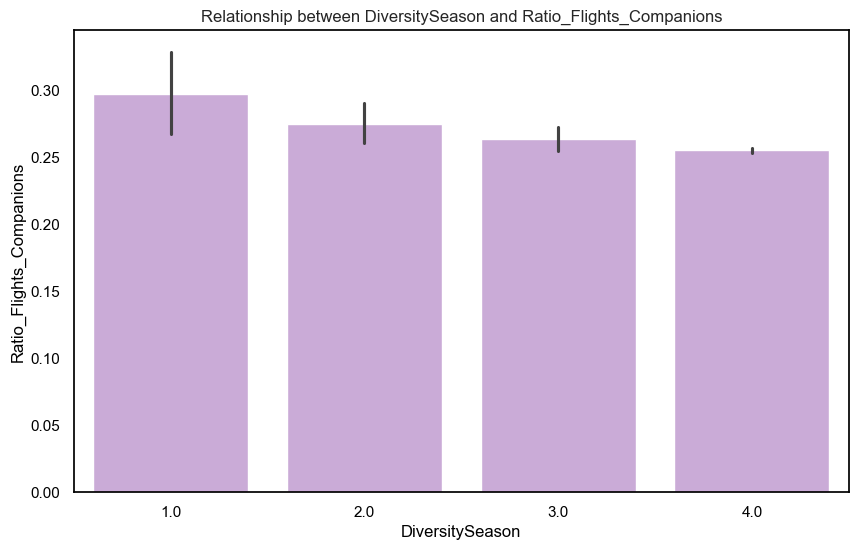

In [510]:
fig = plt.figure(figsize=(10, 6))   
sns.barplot(x='DiversitySeason', y='Ratio_Flights_Companions', data = customers_merged, color = '#CDA4DE')

plt.title("Relationship between DiversitySeason and Ratio_Flights_Companions")
plt.show()

People who only travel in one or 2 seasons flight almost 30% of the time with companions, more than those who travel all year long.

Apart from the Education level the only other feature that seems to have an impact in Income is Marital Status, with single customers having almosta half of the income that married and divorced customers have

People who enrolled in the 2021 Promotion have a much bigger proportion of flights than the one entered via Standard.

In [511]:
customers_merged_categorical

['Province or State',
 'City',
 'Gender',
 'Education',
 'Marital Status',
 'LoyaltyStatus',
 'EnrollmentType',
 'MostFrequentSeason',
 'ChurnStatus',
 'CLV_Category',
 'Income_Category',
 'DiversitySeason']

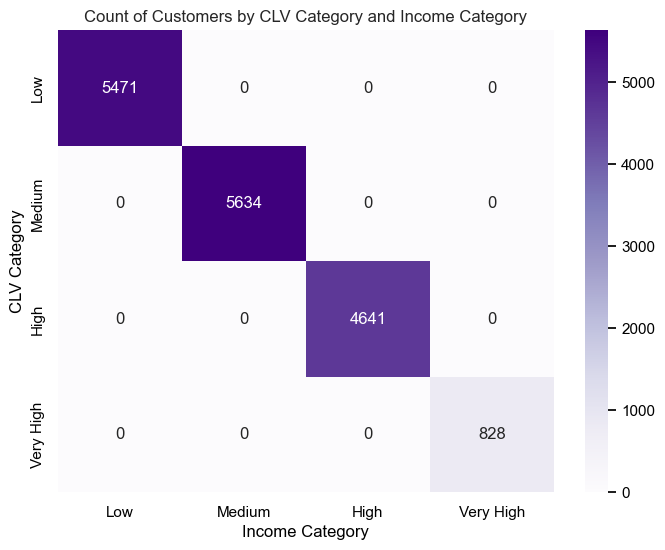

In [512]:
ct = pd.crosstab(customers_merged['CLV_Category'], customers_merged['Income_Category'])

plt.figure(figsize=(8,6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Purples')
plt.title('Count of Customers by CLV Category and Income Category')
plt.xlabel('Income Category')
plt.ylabel('CLV Category')
plt.show()

The category in Income and Customer Lifetime value always match

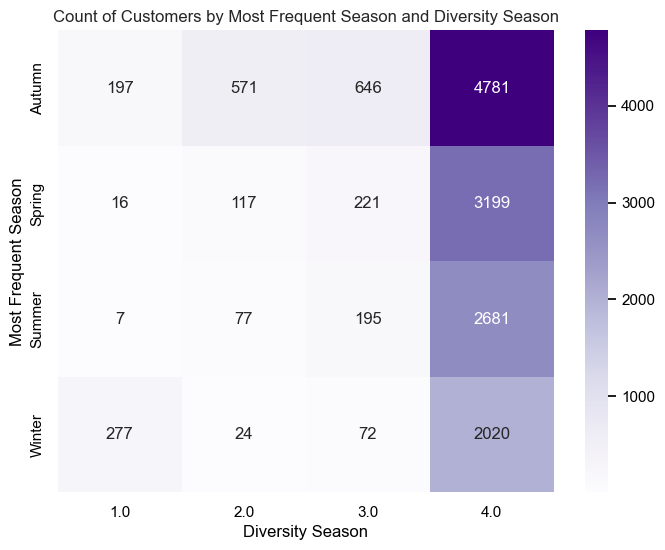

In [513]:
ct = pd.crosstab(customers_merged['MostFrequentSeason'], customers_merged['DiversitySeason'])

plt.figure(figsize=(8,6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Purples')
plt.title('Count of Customers by Most Frequent Season and Diversity Season')
plt.xlabel('Diversity Season')
plt.ylabel('Most Frequent Season')
plt.show()

The majority of customers who travel all year long and from those the most popular season is Autumn. Those who travel in 2 or 3 seasons travel more in Autumn as well. However, those who only travel in one season usually travel during Winter.

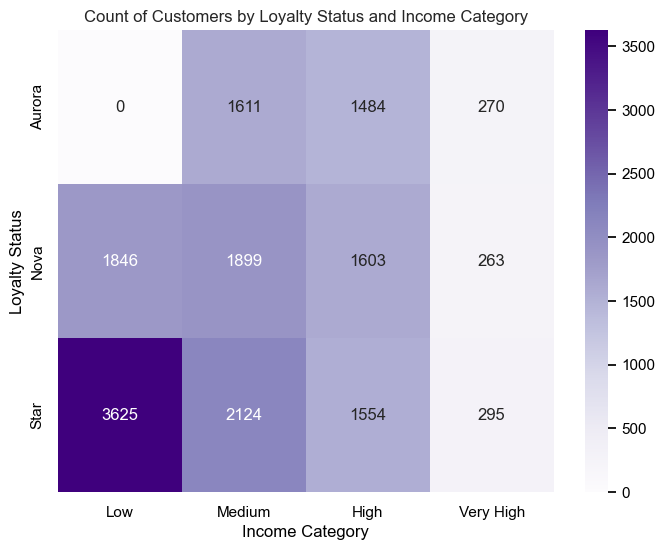

In [514]:
ct = pd.crosstab(customers_merged['LoyaltyStatus'], customers_merged['Income_Category'])

plt.figure(figsize=(8,6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Purples')
plt.title('Count of Customers by Loyalty Status and Income Category')
plt.xlabel('Income Category')
plt.ylabel('Loyalty Status')
plt.show()

There are no customers with Low Income that are also in the Aurora Loyalty Status.

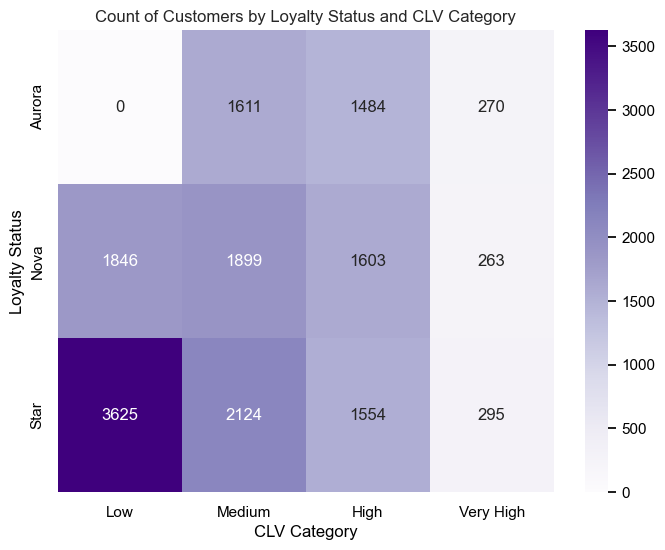

In [515]:
ct = pd.crosstab(customers_merged['LoyaltyStatus'], customers_merged['CLV_Category'])

plt.figure(figsize=(8,6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Purples')
plt.title('Count of Customers by Loyalty Status and CLV Category')
plt.xlabel('CLV Category')
plt.ylabel('Loyalty Status')
plt.show()

There are no customers with Low Costumer Lifetime Value that are also in the Aurora Loyalty Status

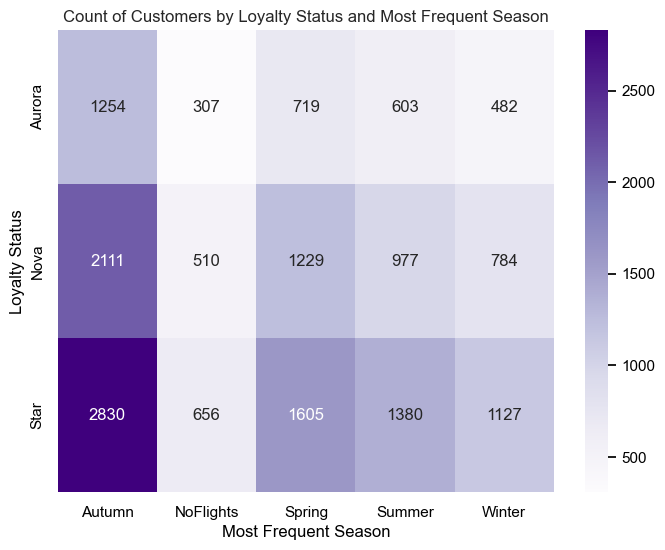

In [516]:
ct = pd.crosstab(customers_merged['LoyaltyStatus'], customers_merged['MostFrequentSeason'])

plt.figure(figsize=(8,6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Purples')
plt.title('Count of Customers by Loyalty Status and Most Frequent Season')
plt.xlabel('Most Frequent Season')
plt.ylabel('Loyalty Status')
plt.show()

The majority of the customers with no flight activity are on Star, then Nova and then Aurora just like the other customers

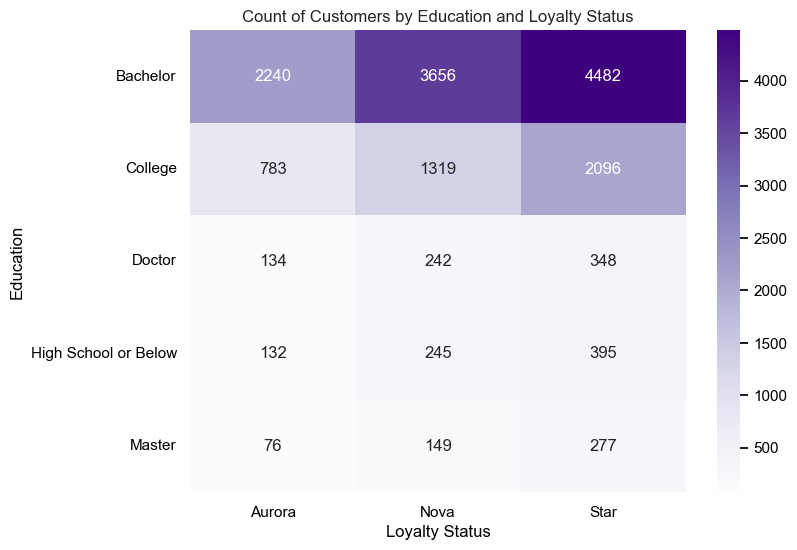

In [517]:
ct = pd.crosstab(customers_merged['Education'], customers_merged['LoyaltyStatus'])

plt.figure(figsize=(8,6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Purples')
plt.title('Count of Customers by Education and Loyalty Status')
plt.xlabel('Loyalty Status')
plt.ylabel('Education')
plt.show()

Most customers whos highest form of education is a bachelor are in the Star Status

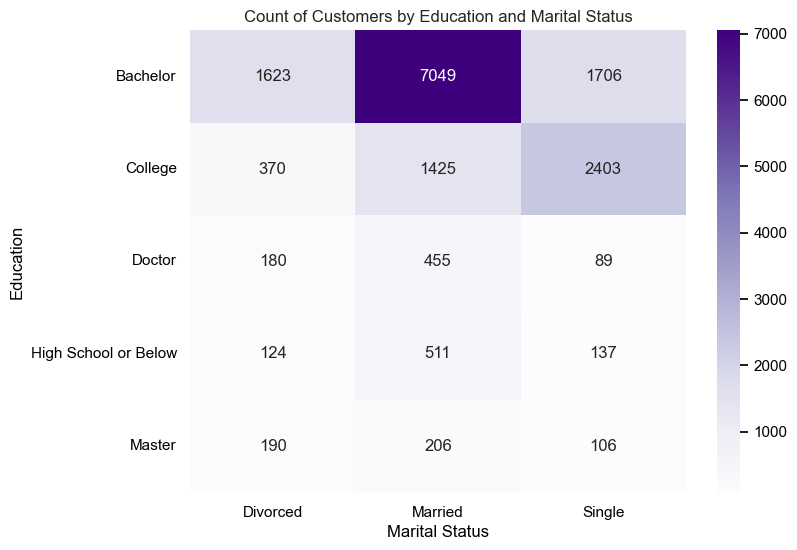

In [518]:
ct = pd.crosstab(customers_merged['Education'], customers_merged['Marital Status'])

plt.figure(figsize=(8,6))
sns.heatmap(ct, annot=True, fmt='d', cmap='Purples')
plt.title('Count of Customers by Education and Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Education')
plt.show()

The majority of customers are married and with a Bachelor as the highest form os education

##### **Churn**

C:\Users\35191\AppData\Local\Temp\ipykernel_27376\1973043515.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  cancellations_over_time = (customers_merged.dropna(subset=['CancellationDate_Datetime']).groupby(pd.Grouper(key='CancellationDate_Datetime', freq='M')).size())


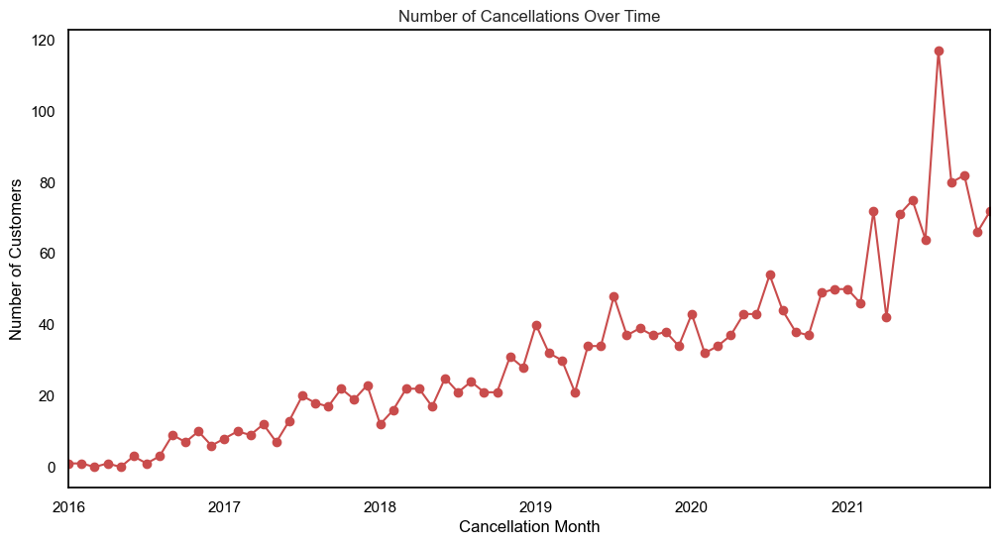

In [519]:
cancellations_over_time = (customers_merged.dropna(subset=['CancellationDate_Datetime']).groupby(pd.Grouper(key='CancellationDate_Datetime', freq='M')).size())

# Plot the cancellation date 
plt.figure(figsize=(12,6))
cancellations_over_time.plot(kind='line', marker='o', color='#C94C4C')
plt.title('Number of Cancellations Over Time')
plt.ylabel('Number of Customers')
plt.xlabel('Cancellation Month')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

The Cancellations keep incresing

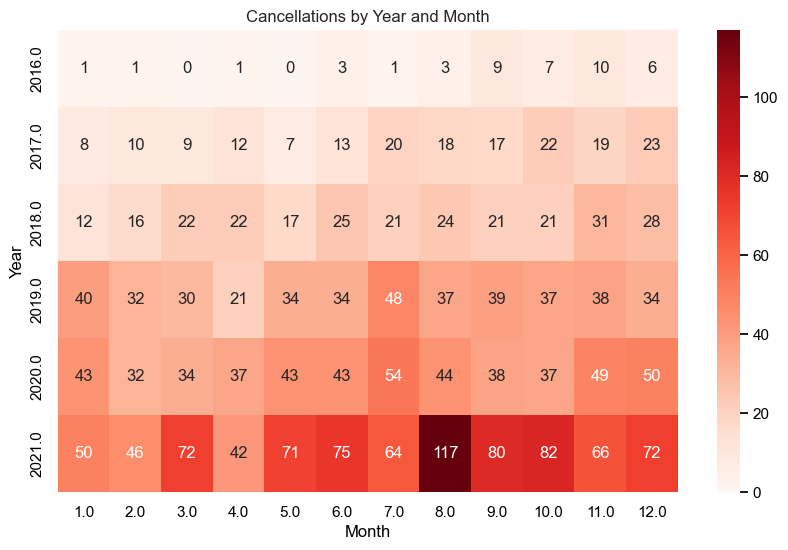

In [520]:
customers_merged['Cancellation_Year'] = customers_merged['CancellationDate_Datetime'].dt.year
customers_merged['Cancellation_Month'] = customers_merged['CancellationDate_Datetime'].dt.month

cancel_counts = (
    customers_merged
    .dropna(subset=['CancellationDate_Datetime'])
    .groupby(['Cancellation_Year', 'Cancellation_Month'])
    .size()
    .unstack(fill_value=0)
)

plt.figure(figsize=(10,6))
sns.heatmap(cancel_counts, annot=True, fmt='d', cmap='Reds')
plt.title('Cancellations by Year and Month')
plt.ylabel('Year')
plt.xlabel('Month')
plt.show()

customers_merged.drop(['Cancellation_Year', 'Cancellation_Month'], axis=1, inplace=True)


There was a huge spike in cancellation in August 2021

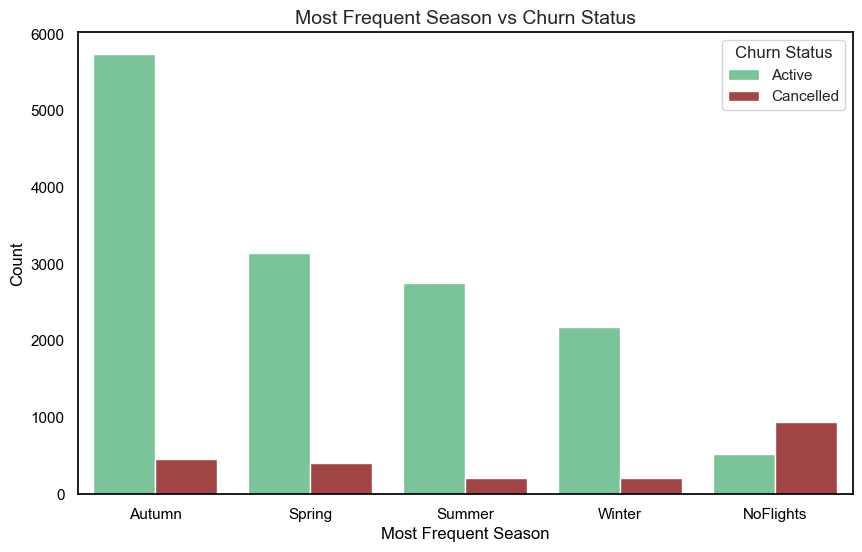

In [521]:
fig = plt.figure(figsize=(10, 6))  
sns.countplot(x='MostFrequentSeason', hue='ChurnStatus', data=customers_merged,  palette=['#6FCF97', '#B03638'])

plt.title('Most Frequent Season vs Churn Status', fontsize=14)
plt.xlabel('Most Frequent Season')
plt.ylabel('Count')
plt.legend(title='Churn Status')
plt.show()

From the customers with no flight activity, most cancelled

#### **Deploy new dataset**

In [522]:
#export merged dataframe to use in dashboards
customers_merged.to_csv('customers_clean.csv', index=False)